# Project: Wrangle and Analyse Data

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#Load Libraries">Load Libraries</a></li>
<li><a href="#Gathering Data">Gathering Data</a></li>
<li><a href="#Assessing Data">Assessing Data</a></li>
<li><a href="#Cleaning Data">Cleaning Data</a></li>
<li><a href="#Reference">Reference</a></li>
</ul>

<a id='intro'></a>
## Introduction

> The dataset that I will be wrangling (and analyzing and visualizing) is the tweet archive of Twitter user [@dog_rates](https://twitter.com/dog_rates), also known as [WeRateDogs](https://en.wikipedia.org/wiki/WeRateDogs). WeRateDogs is a Twitter account that rates people's dogs with a humorous comment about the dog. These ratings almost always have a denominator of 10. The numerators, though? Almost always greater than 10. 11/10, 12/10, 13/10, etc. Why? Because ["they're good dogs Brent."](https://knowyourmeme.com/memes/theyre-good-dogs-brent) WeRateDogs has over 4 million followers and has received international media coverage.

<a id='Load Libraries'></a>
## Load Libraries

In [396]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
% matplotlib inline
import seaborn as sns
import requests
import json
from datetime import datetime
import tweepy
from io import BytesIO
from PIL import Image
pd.set_option("display.max_colwidth",-1) #widen the col width

<a id='Gathering Data'></a>
## Gathering Data

In [397]:
archive = pd.read_csv(r'C:\Udacity\Udacity_term2_projects\t2_wrangle_data_analysis\twitter-archive-enhanced.csv')
archive.shape

(2356, 17)

In [398]:
archive.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

In [4]:
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)

In [5]:
response

<Response [200]>

In [17]:
if not os.path.exists('image-predictions'):
    os.makedirs('image-predictions')

In [6]:
folder_name = 'image-predictions'
with open(os.path.join(folder_name,url.split('/')[-1]),mode = 'wb') as file:
    file.write(response.content)
    

In [399]:
image_pred = pd.read_csv('image-predictions\image-predictions.tsv',sep = '\t')
image_pred.shape

(2075, 12)

In [9]:
consumer_key = "It's Secret"
consumer_secret = "HIDDEN"
access_token = "HIDDEN"
access_secret = "HIDDEN"

In [10]:
auth = tweepy.OAuthHandler(consumer_key,consumer_secret)
auth.set_access_token(access_token,access_secret)

In [11]:
api = tweepy.API(auth_handler=auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True)

In [12]:
tweet = api.get_status(archive['tweet_id'][2000], tweet_mode='extended')

In [13]:
info = tweet._json
info

{'contributors': None,
 'coordinates': None,
 'created_at': 'Thu Dec 03 18:52:12 +0000 2015',
 'display_text_range': [0, 134],
 'entities': {'hashtags': [],
  'media': [{'display_url': 'pic.twitter.com/rVfi6CCidK',
    'expanded_url': 'https://twitter.com/dog_rates/status/672488522314567680/photo/1',
    'id': 672488519928037376,
    'id_str': '672488519928037376',
    'indices': [111, 134],
    'media_url': 'http://pbs.twimg.com/media/CVUovvHWwAAD-nu.jpg',
    'media_url_https': 'https://pbs.twimg.com/media/CVUovvHWwAAD-nu.jpg',
    'sizes': {'large': {'h': 411, 'resize': 'fit', 'w': 304},
     'medium': {'h': 411, 'resize': 'fit', 'w': 304},
     'small': {'h': 411, 'resize': 'fit', 'w': 304},
     'thumb': {'h': 150, 'resize': 'crop', 'w': 150}},
    'type': 'photo',
    'url': 'https://t.co/rVfi6CCidK'}],
  'symbols': [],
  'urls': [],
  'user_mentions': []},
 'extended_entities': {'media': [{'display_url': 'pic.twitter.com/rVfi6CCidK',
    'expanded_url': 'https://twitter.com/dog_

In [14]:
info['favorite_count']

1150

In [15]:
info['retweet_count']

459

In [16]:
info['user']['followers_count']

7074615

In [400]:
file_name = 'tweet_json.txt'

In [22]:
if not os.path.isfile(file_name):
    open(file_name,'w').close()

In [23]:
id_errors = {}
count = 0
start_time = datetime.now()
with open(file_name,'w') as file:
    for tweet_id in archive['tweet_id']:
        try:            
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            file.write(json.dumps(tweet._json) + '\n')
            print(str(count) + '_' + str(tweet_id))
            count += 1
        except Exception as e:
            print(str(count) + '_' + str(tweet_id) + ':' + str(e))
            id_errors[str(count) + '_' + str(tweet_id)] = tweet._json
            count += 1

elapsed_time = datetime.now() - start_time
print("Time to Execute (hh:mm:ss.ms {})".format(elapsed_time))
            
    

0_892420643555336193
1_892177421306343426
2_891815181378084864
3_891689557279858688
4_891327558926688256
5_891087950875897856
6_890971913173991426
7_890729181411237888
8_890609185150312448
9_890240255349198849
10_890006608113172480
11_889880896479866881
12_889665388333682689
13_889638837579907072
14_889531135344209921
15_889278841981685760
16_888917238123831296
17_888804989199671297
18_888554962724278272
19_888202515573088257
19_888202515573088257:[{'code': 144, 'message': 'No status found with that ID.'}]
20_888078434458587136
21_887705289381826560
22_887517139158093824
23_887473957103951883
24_887343217045368832
25_887101392804085760
26_886983233522544640
27_886736880519319552
28_886680336477933568
29_886366144734445568
30_886267009285017600
31_886258384151887873
32_886054160059072513
33_885984800019947520
34_885528943205470208
35_885518971528720385
36_885311592912609280
37_885167619883638784
38_884925521741709313
39_884876753390489601
40_884562892145688576
41_884441805382717440
42_8

333_832757312314028032
334_832682457690300417
335_832645525019123713
336_832636094638288896
337_832397543355072512
338_832369877331693569
339_832273440279240704
340_832215909146226688
341_832215726631055365
342_832088576586297345
343_832040443403784192
344_832032802820481025
345_831939777352105988
346_831926988323639298
347_831911600680497154
348_831670449226514432
349_831650051525054464
350_831552930092285952
351_831322785565769729
352_831315979191906304
353_831309418084069378
354_831262627380748289
355_830956169170665475
356_830583320585068544
357_830173239259324417
358_830097400375152640
359_829878982036299777
360_829861396166877184
361_829501995190984704
362_829449946868879360
363_829374341691346946
364_829141528400556032
365_829011960981237760
366_828801551087042563
367_828770345708580865
368_828708714936930305
369_828650029636317184
370_828409743546925057
371_828408677031882754
372_828381636999917570
373_828376505180889089
374_828372645993398273
375_828361771580813312
376_8280465

682_788552643979468800
683_788412144018661376
684_788178268662984705
685_788150585577050112
686_788070120937619456
687_788039637453406209
688_787810552592695296
689_787717603741622272
690_787397959788929025
691_787322443945877504
692_787111942498508800
693_786963064373534720
694_786729988674449408
695_786709082849828864
696_786664955043049472
697_786595970293370880
698_786363235746385920
699_786286427768250368
700_786233965241827333
701_786051337297522688
702_786036967502913536
703_785927819176054784
704_785872687017132033
705_785639753186217984
706_785533386513321988
707_785515384317313025
708_785264754247995392
709_785170936622350336
710_784826020293709826
711_784517518371221505
712_784431430411685888
713_784183165795655680
714_784057939640352768
715_783839966405230592
716_783821107061198850
717_783695101801398276
718_783466772167098368
719_783391753726550016
720_783347506784731136
721_783334639985389568
722_783085703974514689
723_782969140009107456
724_782747134529531904
725_7827225

1030_745433870967832576
1031_745422732645535745
1032_745314880350101504
1033_745074613265149952
1034_745057283344719872
1035_744995568523612160
1036_744971049620602880
1037_744709971296780288
1038_744334592493166593
1039_744234799360020481
1040_744223424764059648
1041_743980027717509120
1042_743895849529389061
1043_743835915802583040
1044_743609206067040256
1045_743595368194129920
1046_743545585370791937
1047_743510151680958465
1048_743253157753532416
1049_743222593470234624
1050_743210557239623680
1051_742534281772302336
1052_742528092657332225
1053_742465774154047488
1054_742423170473463808
1055_742385895052087300
1056_742161199639494656
1057_742150209887731712
1058_741793263812808706
1059_741743634094141440
1060_741438259667034112
1061_741303864243200000
1062_741099773336379392
1063_741067306818797568
1064_740995100998766593
1065_740711788199743490
1066_740699697422163968
1067_740676976021798912
1068_740373189193256964
1069_740365076218183684
1070_740359016048689152
1071_74021403858

1372_702217446468493312
1373_701981390485725185
1374_701952816642965504
1375_701889187134500865
1376_701805642395348998
1377_701601587219795968
1378_701570477911896070
1379_701545186879471618
1380_701214700881756160
1381_700890391244103680
1382_700864154249383937
1383_700847567345688576
1384_700796979434098688
1385_700747788515020802
1386_700518061187723268
1387_700505138482569216
1388_700462010979500032
1389_700167517596164096
1390_700151421916807169
1391_700143752053182464
1392_700062718104104960
1393_700029284593901568
1394_700002074055016451
1395_699801817392291840
1396_699788877217865730
1397_699779630832685056
1398_699775878809702401
1399_699691744225525762
1400_699446877801091073
1401_699434518667751424
1402_699423671849451520
1403_699413908797464576
1404_699370870310113280
1405_699323444782047232
1406_699088579889332224
1407_699079609774645248
1408_699072405256409088
1409_699060279947165696
1410_699036661657767936
1411_698989035503689728
1412_698953797952008193
1413_69890797426

1714_680440374763077632
1715_680221482581123072
1716_680206703334408192
1717_680191257256136705
1718_680176173301628928
1719_680161097740095489
1720_680145970311643136
1721_680130881361686529
1722_680115823365742593
1723_680100725817409536
1724_680085611152338944
1725_680070545539371008
1726_680055455951884288
1727_679877062409191424
1728_679872969355714560
1729_679862121895714818
1730_679854723806179328
1731_679844490799091713
1732_679828447187857408
1733_679777920601223168
1734_679736210798047232
1735_679729593985699840
1736_679722016581222400
1737_679530280114372609
1738_679527802031484928
1739_679511351870550016
1740_679503373272485890
1741_679475951516934144
1742_679462823135686656
1743_679405845277462528
1744_679158373988876288
1745_679148763231985668
1746_679132435750195208
1747_679111216690831360
1748_679062614270468097
1749_679047485189439488
1750_679001094530465792
1751_678991772295516161
1752_678969228704284672
1753_678800283649069056
1754_678798276842360832
1755_67877492860

2056_671357843010908160
2057_671355857343524864
2058_671347597085433856
2059_671186162933985280
2060_671182547775299584
2061_671166507850801152
2062_671163268581498880
2063_671159727754231808
2064_671154572044468225
2065_671151324042559489
2066_671147085991960577
2067_671141549288370177
2068_671138694582165504
2069_671134062904504320
2070_671122204919246848
2071_671115716440031232
2072_671109016219725825
2073_670995969505435648
2074_670842764863651840
2075_670840546554966016
2076_670838202509447168
2077_670833812859932673
2078_670832455012716544
2079_670826280409919488
2080_670823764196741120
2081_670822709593571328
2082_670815497391357952
2083_670811965569282048
2084_670807719151067136
2085_670804601705242624
2086_670803562457407488
2087_670797304698376195
2088_670792680469889025
2089_670789397210615808
2090_670786190031921152
2091_670783437142401025
2092_670782429121134593
2093_670780561024270336
2094_670778058496974848
2095_670764103623966721
2096_670755717859713024
2097_67073341287

In [401]:
df_list = []

with open(file_name,'r') as file:
    for line in file.readlines():
        tweet_json = json.loads(line)
        favorite_count = tweet_json['favorite_count']
        retweet_count = tweet_json['retweet_count']
        tweet_id = tweet_json['id']
        df_list.append({'favorite_count':favorite_count,
                        'retweet_count':retweet_count,
                       'tweet_id': tweet_id})
    

In [402]:
twitter_archive_additional = pd.DataFrame(df_list,columns = ['tweet_id','favorite_count','retweet_count'])

<a id='Assessing Data'></a>
## Assessing Data

In [403]:
print("Rows and Columns in twitter_archive_additional:",twitter_archive_additional.shape)
twitter_archive_additional

Rows and Columns in twitter_archive_additional: (2344, 3)


,tweet_id,favorite_count,retweet_count
0,892420643555336193,38650,8546
1,892177421306343426,33126,6285
2,891815181378084864,24933,4165
3,891689557279858688,42024,8676
4,891327558926688256,40182,9426
5,891087950875897856,20149,3122
6,890971913173991426,11809,2076
7,890729181411237888,65281,18941
8,890609185150312448,27699,4277
9,890240255349198849,31835,7437


In [404]:
for index,col in enumerate(twitter_archive_additional):
    print(index+1,col)

1 tweet_id
2 favorite_count
3 retweet_count


In [405]:
print("Rows and Columns in archive:",archive.shape)
archive

Rows and Columns in archive: (2356, 17)


,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,https://twitter.com/dog_rates/status/890971913173991426/photo/1",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/890729181411237888/photo/1,https://twitter.com/dog_rates/status/890729181411237888/photo/1",13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185150312448/photo/1,13,10,Zoey,None,None,None,None
9,89024025534

In [406]:
for index,col in enumerate(archive):
    print(index+1,col)

1 tweet_id
2 in_reply_to_status_id
3 in_reply_to_user_id
4 timestamp
5 source
6 text
7 retweeted_status_id
8 retweeted_status_user_id
9 retweeted_status_timestamp
10 expanded_urls
11 rating_numerator
12 rating_denominator
13 name
14 doggo
15 floofer
16 pupper
17 puppo


In [407]:
print("Rows and Columns in image_pred:",image_pred.shape)
image_pred

Rows and Columns in image_pred: (2075, 12)


,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,0.263788,True,Greater_Swiss_Mountain_dog,0.016199,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,0.045885,False,terrapin,0.017885,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,0.058279,True,fur_coat,0.054449,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,0.014594,False,golden_retriever,0.007959,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,0.192305,True,soft-coated_wheaten_terrier,0.082086,True


In [408]:
for index,col in enumerate(image_pred):
    print(index+1,col)

1 tweet_id
2 jpg_url
3 img_num
4 p1
5 p1_conf
6 p1_dog
7 p2
8 p2_conf
9 p2_dog
10 p3
11 p3_conf
12 p3_dog


In [409]:
archive.dtypes

tweet_id                      int64  
in_reply_to_status_id         float64
in_reply_to_user_id           float64
timestamp                     object 
source                        object 
text                          object 
retweeted_status_id           float64
retweeted_status_user_id      float64
retweeted_status_timestamp    object 
expanded_urls                 object 
rating_numerator              int64  
rating_denominator            int64  
name                          object 
doggo                         object 
floofer                       object 
pupper                        object 
puppo                         object 
dtype: object

In [410]:
image_pred.dtypes

tweet_id    int64  
jpg_url     object 
img_num     int64  
p1          object 
p1_conf     float64
p1_dog      bool   
p2          object 
p2_conf     float64
p2_dog      bool   
p3          object 
p3_conf     float64
p3_dog      bool   
dtype: object

In [411]:
twitter_archive_additional.dtypes

tweet_id          int64
favorite_count    int64
retweet_count     int64
dtype: object

In [412]:
total = archive.isnull().sum().sort_values(ascending = False)
percent = ((archive.isnull().sum()/archive.isnull().shape[0])*100).sort_values(ascending = False)
pd.concat([total,percent],keys = ['total','percent'],axis = 1)

,total,percent
in_reply_to_status_id,2278,96.689304
in_reply_to_user_id,2278,96.689304
retweeted_status_timestamp,2175,92.317487
retweeted_status_user_id,2175,92.317487
retweeted_status_id,2175,92.317487
expanded_urls,59,2.504244
timestamp,0,0.000000
source,0,0.000000
text,0,0.000000
puppo,0,0.000000


In [413]:
total = image_pred.isnull().sum().sort_values(ascending = False)
percent = ((image_pred.isnull().sum()/image_pred.isnull().shape[0])*100).sort_values(ascending = False)
pd.concat([total,percent],keys = ['total','percent'],axis = 1)

,total,percent
p3_dog,0,0.0
p3_conf,0,0.0
p3,0,0.0
p2_dog,0,0.0
p2_conf,0,0.0
p2,0,0.0
p1_dog,0,0.0
p1_conf,0,0.0
p1,0,0.0
img_num,0,0.0


In [414]:
total = twitter_archive_additional.isnull().sum().sort_values(ascending = False)
percent = ((twitter_archive_additional.isnull().sum()/twitter_archive_additional.isnull().shape[0])*100).sort_values(ascending = False)
pd.concat([total,percent],keys = ['total','percent'],axis = 1)

,total,percent
retweet_count,0,0.0
favorite_count,0,0.0
tweet_id,0,0.0


In [415]:
archive.duplicated().sum()

0

In [416]:
image_pred.duplicated().sum()

0

In [417]:
twitter_archive_additional.duplicated().sum()

0

In [418]:
archive['name'].value_counts()

None            745
a               55 
Charlie         12 
Cooper          11 
Oliver          11 
Lucy            11 
Tucker          10 
Penny           10 
Lola            10 
Winston         9  
Bo              9  
the             8  
Sadie           8  
Bailey          7  
an              7  
Daisy           7  
Buddy           7  
Toby            7  
Jax             6  
Jack            6  
Dave            6  
Stanley         6  
Bella           6  
Koda            6  
Scout           6  
Oscar           6  
Rusty           6  
Milo            6  
Leo             6  
Finn            5  
               ..  
Ace             1  
Jed             1  
Sully           1  
Lassie          1  
Obie            1  
Aldrick         1  
officially      1  
Willow          1  
Finnegus        1  
Strider         1  
Ed              1  
Dixie           1  
Miguel          1  
Malikai         1  
Bookstore       1  
Dewey           1  
Edd             1  
Akumi           1  
Obi             1  


In [419]:
archive.query("name == 'my'").loc[:,['text','name']]

,text,name
852,This is my dog. Her name is Zoey. She knows I've been rating other dogs. She's not happy. 13/10 no bias at all https://t.co/ep1NkYoiwB,my


In [420]:
archive['rating_numerator'].describe()

count    2356.000000
mean     13.126486  
std      45.876648  
min      0.000000   
25%      10.000000  
50%      11.000000  
75%      12.000000  
max      1776.000000
Name: rating_numerator, dtype: float64

In [421]:
archive['rating_denominator'].describe()

count    2356.000000
mean     10.455433  
std      6.745237   
min      0.000000   
25%      10.000000  
50%      10.000000  
75%      10.000000  
max      170.000000 
Name: rating_denominator, dtype: float64

In [422]:
print("Total retweets:",archive.shape[0] - archive['retweeted_status_id'].isnull().sum())

Total retweets: 181


## Quality

### **`archive table`**

- 1.Missing data is represented by None instead of NaN in
> - name                          
> - doggo                         
> - floofer                     
> - pupper                        
> - puppo

- 2.rating numerator has few records with numerator less than 10 ideally numerator should be greater than 10
- 3.rating denominator has few records less than 10 ideally denominator should be 10 
- 4.Names of dogs are not names i.e. are a,an,the,such
- 5.we want original rating so remove retweets which are 181 in total
- 6.original ratings with no image
- 7.tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_user_id,retweeted_status_id columns are int instead of str
- 8.timestamp,retweeted_status_timestamp columns are object instead of datetime 
- 9.Doggo's name is Zoey but mentioned as my.

### **`image_pred table`**

- 1.datatype of tweet_id is int,it should be str

### **`twitter_archive_additional`**

- 1.datatype of tweet_id is int,it should be str

## **Tidiness**
- 1.`archive table` and `twitter_archive_additional` tables should be combined.
- 2.Melt all the four stages of dogs in `archive table` 
- 3.text column in `archive table` should be split into text and url
- 4.`image_pred` has multiple columns with similar information. 




<a id='Cleaning Data'></a>
## Cleaning Data

In [423]:
# Copy dataframes into another before moving to cleaning preocess
archive_clean = archive.copy()
image_pred_clean = image_pred.copy()
twitter_archive_additional_clean = twitter_archive_additional.copy()

## Missing Data

### Define
- Replace missing data from None to NaN using replace method

### Code

In [424]:
archive_clean.loc[archive_clean['name'] == 'None','name'] = np.nan
archive_clean.loc[archive_clean['doggo'] == 'None','doggo'] = np.nan
archive_clean.loc[archive_clean['floofer'] == 'None','floofer'] = np.nan
archive_clean.loc[archive_clean['pupper'] == 'None','pupper'] = np.nan
archive_clean.loc[archive_clean['puppo'] == 'None','puppo'] = np.nan

### Test

In [425]:
print("Sum of Available None in Name:", archive_clean['name'].str.contains('None').sum())
print("Sum of Available None in doggo:", archive_clean['doggo'].str.contains('None').sum())
print("Sum of Available None in floofer:", archive_clean['floofer'].str.contains('None').sum())
print("Sum of Available None in pupper:", archive_clean['pupper'].str.contains('None').sum())
print("Sum of Available None in puppo:", archive_clean['puppo'].str.contains('None').sum())

Sum of Available None in Name: 0
Sum of Available None in doggo: 0
Sum of Available None in floofer: 0
Sum of Available None in pupper: 0
Sum of Available None in puppo: 0


### Define
- Requirement is to have the original rating i.e. no retweets.wherever retweet_status_id has id mentioned is retweet.
- Get all the retweeted status id and then delete them from archive_clean table

### Code

In [426]:
delete_index = archive_clean.query("retweeted_status_id != 'NaN'").index
delete_index

Int64Index([  19,   32,   36,   68,   73,   74,   78,   91,   95,   97,
            ...
             926,  937,  943,  949, 1012, 1023, 1043, 1242, 2259, 2260],
           dtype='int64', length=181)

In [427]:
archive_clean.shape

(2356, 17)

In [428]:
archive_clean.drop(labels = delete_index,axis = 0,inplace = True)

### Test


In [429]:
archive_clean.shape

(2175, 17)

In [430]:
delete_index

Int64Index([  19,   32,   36,   68,   73,   74,   78,   91,   95,   97,
            ...
             926,  937,  943,  949, 1012, 1023, 1043, 1242, 2259, 2260],
           dtype='int64', length=181)

In [431]:
archive_clean[archive_clean['tweet_id'].isin(delete_index)]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


### Define

- We require original ratings with images.
- We need only those tweet_id's present in image_pred table 

### Code

In [432]:
image = archive_clean['tweet_id'].isin(image_pred_clean['tweet_id'])
image.sum()

1994

In [433]:
archive_clean.shape

(2175, 17)

In [434]:
archive_clean = archive_clean[image]

### Test

In [435]:
archive_clean.shape

(1994, 17)

In [436]:
archive_clean.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,NaN,NaN,NaN,NaN
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,NaN,NaN,NaN,NaN
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,NaN,NaN,NaN,NaN
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,NaN,NaN,NaN,NaN
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,NaN,NaN,NaN,NaN


## Tidiness

### Define
- Melt doggo,floofer,pupper,puppo columns to dog_stage. 
- If I try to melt the columns (doggo,floofer,pupper,puppo) I will get multiple duplicates that would be difficult to work with.Instead I have planned to make four different dataframes for doggo,floofer,pupper and puppo and then accordingly make column dog_stage for each of those dataframes.After that append them to make single Dataframe.

### Code

In [437]:
list(archive_clean.columns)

['tweet_id',
 'in_reply_to_status_id',
 'in_reply_to_user_id',
 'timestamp',
 'source',
 'text',
 'retweeted_status_id',
 'retweeted_status_user_id',
 'retweeted_status_timestamp',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'doggo',
 'floofer',
 'pupper',
 'puppo']

In [438]:
# Dataframe for each dog_type
archive_floofer = archive_clean.loc[archive_clean['floofer'] == 'floofer',:].copy()
archive_pupper = archive_clean.loc[archive_clean['pupper'] == 'pupper',:].copy()
archive_puppo = archive_clean.loc[archive_clean['puppo'] == 'puppo',:].copy()
archive_doggo = archive_clean.loc[archive_clean['doggo'] == 'doggo',:].copy()

In [439]:
print(archive_floofer.shape)
print(archive_pupper.shape)
print(archive_puppo.shape)
print(archive_doggo.shape)

(8, 17)
(212, 17)
(23, 17)
(74, 17)


In [440]:
# delete unwanted columns
archive_floofer.drop(labels = ['doggo','pupper','puppo'],axis = 1,inplace = True)
archive_puppo.drop(labels = ['doggo','floofer','pupper'],axis = 1,inplace = True)
archive_pupper.drop(labels = ['doggo','floofer','puppo'],axis = 1,inplace = True)
archive_doggo.drop(labels = ['pupper','floofer','puppo'],axis = 1,inplace = True)

In [441]:
# Create 'dog_stage' column in each table to append them later
archive_floofer.rename(columns={'floofer':'dog_stage'},inplace = True)
archive_pupper.rename(columns={'pupper':'dog_stage'},inplace = True)
archive_puppo.rename(columns={'puppo':'dog_stage'},inplace = True)
archive_doggo.rename(columns={'doggo':'dog_stage'},inplace = True)

In [442]:
archive_dog_stage = archive_doggo.append([archive_puppo,archive_pupper,archive_floofer])

In [443]:
archive_dog_stage.shape

(317, 14)

In [444]:
archive_dog_stage.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,dog_stage
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255349198849/photo/1,14,10,Cassie,doggo
43,884162670584377345,NaN,NaN,2017-07-09 21:29:42 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Yogi. He doesn't have any important dog meetings today he just enjoys looking his best at all times. 12/10 for dangerously dapper doggo https://t.co/YSI00BzTBZ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/884162670584377345/photo/1,12,10,Yogi,doggo
99,872967104147763200,NaN,NaN,2017-06-09 00:02:31 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a very large dog. He has a date later. Politely asked this water person to check if his breath is bad. 12/10 good to go doggo https://t.co/EMYIdoblMR,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/872967104147763200/photo/1,https://twitter.com/dog_rates/status/872967104147763200/photo/1",12,10,NaN,doggo
108,871515927908634625,NaN,NaN,2017-06-04 23:56:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Napolean. He's a Raggedy East Nicaraguan Zoom Zoom. Runs on one leg. Built for deception. No eyes. Good with kids. 12/10 great doggo https://t.co/PR7B7w1rUw,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/871515927908634625/photo/1,https://twitter.com/dog_rates/status/871515927908634625/photo/1",12,10,Napolean,doggo
121,869596645499047938,NaN,NaN,2017-05-30 16:49:31 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Scout. He just graduated. Officially a doggo now. Have fun with taxes and losing sight of your ambitions. 12/10 would throw cap for https://t.co/DsA2hwXAJo,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/869596645499047938/photo/1,https://twitter.com/dog_rates/status/869596645499047938/photo/1",12,10,Scout,doggo


In [445]:
archive_dog_stage.index

Int64Index([   9,   43,   99,  108,  121,  172,  191,  200,  240,  248,
            ...
            2015, 2017,   46,  200,  582,  774,  984, 1091, 1110, 1614],
           dtype='int64', length=317)

In [446]:
archive_clean.shape

(1994, 17)

In [447]:
# Delete archive_dog_stage index from archive_clean table 
archive_clean.drop(labels = archive_dog_stage.index,axis = 0,inplace = True)

In [448]:
archive_clean.shape

(1688, 17)

In [449]:
# Delete doggo,pupper,puppo,floofer and make column dog_stage in archive_clean table
archive_clean.drop(labels = ['doggo','pupper','puppo','floofer'],axis = 1,inplace = True)

In [450]:
archive_clean.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name'],
      dtype='object')

In [451]:
# Fill dog_stage column with NaN values
archive_clean['dog_stage'] = np.repeat('NaN',archive_clean.shape[0])

In [452]:
# append both the dataframes
archive_clean = archive_dog_stage.append(archive_clean)

In [453]:
archive_clean.shape

(2005, 14)

In [454]:
list(archive_clean.columns)

['tweet_id',
 'in_reply_to_status_id',
 'in_reply_to_user_id',
 'timestamp',
 'source',
 'text',
 'retweeted_status_id',
 'retweeted_status_user_id',
 'retweeted_status_timestamp',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'dog_stage']

In [455]:
archive_clean['tweet_id'].duplicated().sum()

11

In [456]:
# dog_stage should converted to category type
archive_clean['dog_stage'] = archive_clean['dog_stage'].astype('category')

### Test

In [457]:
archive_clean['dog_stage'].dtypes

CategoricalDtype(categories=['NaN', 'doggo', 'floofer', 'pupper', 'puppo'], ordered=False)

In [458]:
archive_clean.loc[:,['tweet_id','text','dog_stage']].sample(10)

,tweet_id,text,dog_stage
1384,700796979434098688,This is Daniel. He's a neat pup. Exotic af. Custom paws. Leaps unannounced. Would totally pet. 7/10 daaamn Daniel https://t.co/5XaR0kj8cr,NaN
1957,673583129559498752,This is Sandy. She loves her spot by the tree. Contemplating her true purpose in the universe. Wears socks. 11/10 https://t.co/JpoEvgbDug,NaN
131,867051520902168576,"Oh my this spooked me up. We only rate dogs, not happy ghosts. Please send dogs only. It's a very simple premise. Thank you... 13/10 https://t.co/M5Rz0R8SIQ",NaN
2114,670433248821026816,This is Sam. He's trying to escape the inordinate monotony of conforming to everyday status quo. 10/10 https://t.co/PXnCdz8qzK,NaN
1314,706901761596989440,This is Elliot. He's blocking the roadway. Downright rude as hell. Doesn't care that you're already late. 3/10 https://t.co/FMUxir5pYu,NaN
486,814530161257443328,This is Alf. Someone just rubbed a balloon on his head. He's only a little pupset about it. 12/10 would pet well https://t.co/IOdgfnSE9G,NaN
1492,692828166163931137,This pupper just descended from heaven. 12/10 can probably fly https://t.co/X6X9wM7NuS,pupper
1470,694001791655137281,This is Chester. He's a Benefloof Cumberbark. Fabulous ears. Nifty shirt. Was probably on sale. Nice hardwood. 11/10 https://t.co/YoII7tWXMT,NaN
457,818145370475810820,This is Autumn. Her favorite toy is a cheeseburger. She takes it everywhere. 11/10 https://t.co/JlPug12E5Z,NaN
4,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN


In [459]:
archive_clean['dog_stage'].value_counts()

NaN        1688
pupper     212 
doggo      74  
puppo      23  
floofer    8   
Name: dog_stage, dtype: int64

### Define
- Use regular expression to extract tweet url from text column

### Code

In [460]:
archive_clean['text'].head()

9      This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A       
43     Meet Yogi. He doesn't have any important dog meetings today he just enjoys looking his best at all times. 12/10 for dangerously dapper doggo https://t.co/YSI00BzTBZ
99     Here's a very large dog. He has a date later. Politely asked this water person to check if his breath is bad. 12/10 good to go doggo https://t.co/EMYIdoblMR        
108    This is Napolean. He's a Raggedy East Nicaraguan Zoom Zoom. Runs on one leg. Built for deception. No eyes. Good with kids. 12/10 great doggo https://t.co/PR7B7w1rUw
121    This is Scout. He just graduated. Officially a doggo now. Have fun with taxes and losing sight of your ambitions. 12/10 would throw cap for https://t.co/DsA2hwXAJo 
Name: text, dtype: object

> **https?://t.co/[A-Za-z0-9]+ regular expression tells match 0 or 1 https then check for ://t.co/ followed by alphanumeric characters**

In [461]:
archive_clean['tweet_url'] = archive_clean['text'].str.extract(r'(https?://t.co/[A-Za-z0-9]+)')

C:\Users\pooja\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: currently extract(expand=None) means expand=False (return Index/Series/DataFrame) but in a future version of pandas this will be changed to expand=True (return DataFrame)
  """Entry point for launching an IPython kernel.


In [462]:
# to separate text from url split on 'https' and get first item
archive_clean['text'] = archive_clean['text'].apply(lambda x:x.split('https')[0])

### Test

In [463]:
archive_clean.loc[:,['text','tweet_url']].head()

,text,tweet_url
9,This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate,https://t.co/t1bfwz5S2A
43,Meet Yogi. He doesn't have any important dog meetings today he just enjoys looking his best at all times. 12/10 for dangerously dapper doggo,https://t.co/YSI00BzTBZ
99,Here's a very large dog. He has a date later. Politely asked this water person to check if his breath is bad. 12/10 good to go doggo,https://t.co/EMYIdoblMR
108,This is Napolean. He's a Raggedy East Nicaraguan Zoom Zoom. Runs on one leg. Built for deception. No eyes. Good with kids. 12/10 great doggo,https://t.co/PR7B7w1rUw
121,This is Scout. He just graduated. Officially a doggo now. Have fun with taxes and losing sight of your ambitions. 12/10 would throw cap for,https://t.co/DsA2hwXAJo


### Define

- combine archive_clean and twitter_archive_additional_clean 

### Code

In [464]:
twitter_archive_additional_clean.columns

Index(['tweet_id', 'favorite_count', 'retweet_count'], dtype='object')

In [465]:
archive_clean.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'dog_stage', 'tweet_url'],
      dtype='object')

In [466]:
archive_clean.shape,twitter_archive_additional_clean.shape

((2005, 15), (2344, 3))

In [467]:
# Merge archive_clean and twitter_archive_additional_clean 
archive_master_clean = pd.merge(archive_clean,twitter_archive_additional_clean,how = 'left',on = 'tweet_id')

### Test

In [468]:
print(archive_master_clean.shape)
archive_master_clean.head()

(2005, 17)


,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,tweet_url,favorite_count,retweet_count
0,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255349198849/photo/1,14,10,Cassie,doggo,https://t.co/t1bfwz5S2A,31835.0,7437.0
1,884162670584377345,NaN,NaN,2017-07-09 21:29:42 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Yogi. He doesn't have any important dog meetings today he just enjoys looking his best at all times. 12/10 for dangerously dapper doggo,NaN,NaN,NaN,https://twitter.com/dog_rates/status/884162670584377345/photo/1,12,10,Yogi,doggo,https://t.co/YSI00BzTBZ,20316.0,2991.0
2,872967104147763200,NaN,NaN,2017-06-09 00:02:31 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a very large dog. He has a date later. Politely asked this water person to check if his breath is bad. 12/10 good to go doggo,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/872967104147763200/photo/1,https://twitter.com/dog_rates/status/872967104147763200/photo/1",12,10,NaN,doggo,https://t.co/EMYIdoblMR,27391.0,5457.0
3,871515927908634625,NaN,NaN,2017-06-04 23:56:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Napolean. He's a Raggedy East Nicaraguan Zoom Zoom. Runs on one leg. Built for deception. No eyes. Good with kids. 12/10 great doggo,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/871515927908634625/photo/1,https://twitter.com/dog_rates/status/871515927908634625/photo/1",12,10,Napolean,doggo,https://t.co/PR7B7w1rUw,20257.0,3499.0
4,869596645499047938,NaN,NaN,2017-05-30 16:49:31 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Scout. He just graduated. Officially a doggo now. Have fun with taxes and losing sight of your ambitions. 12/10 would throw cap for,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/869596645499047938/photo/1,https://twitter.com/dog_rates/status/869596645499047938/photo/1",12,10,Scout,doggo,https://t.co/DsA2hwXAJo,16094.0,3196.0


In [469]:
pd.Series(list(archive_master_clean.columns))

0     tweet_id                  
1     in_reply_to_status_id     
2     in_reply_to_user_id       
3     timestamp                 
4     source                    
5     text                      
6     retweeted_status_id       
7     retweeted_status_user_id  
8     retweeted_status_timestamp
9     expanded_urls             
10    rating_numerator          
11    rating_denominator        
12    name                      
13    dog_stage                 
14    tweet_url                 
15    favorite_count            
16    retweet_count             
dtype: object

### Define
- Melt image pred table

### Code

In [470]:
print(image_pred_clean.shape)
image_pred_clean.head()

(2075, 12)


,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [471]:
list(image_pred_clean.columns)

['tweet_id',
 'jpg_url',
 'img_num',
 'p1',
 'p1_conf',
 'p1_dog',
 'p2',
 'p2_conf',
 'p2_dog',
 'p3',
 'p3_conf',
 'p3_dog']

In [472]:
# Change column names
col_names = ['tweet_id', 'jpg_url', 'img_num', 
             'prediction_1', 'confidence_1', 'ispred_1', 
             'prediction_2', 'confidence_2', 'ispred_2', 
             'prediction_3', 'confidence_3', 'ispred_3']
image_pred_clean.columns = col_names

In [473]:
image_pred_clean = pd.wide_to_long(image_pred_clean,
                stubnames=['prediction', 'confidence', 'ispred'],
                i=['tweet_id', 'jpg_url', 'img_num'], j='prediction_order', sep='_')\
.reset_index()

### Test

In [474]:
print(image_pred_clean.shape)
image_pred_clean.head()

(6225, 7)


,tweet_id,jpg_url,img_num,prediction_order,prediction,confidence,ispred
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,1,Welsh_springer_spaniel,0.465074,True
1,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,2,collie,0.156665,True
2,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,3,Shetland_sheepdog,0.061428,True
3,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,1,redbone,0.506826,True
4,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,2,miniature_pinscher,0.074192,True


## Quality

### Define
- change dtype of timestamp and retweeted_status_timestamp columns to datetime

### Code

In [475]:
archive_master_clean['timestamp'] = pd.to_datetime(archive_master_clean['timestamp'])

In [476]:
archive_master_clean['retweeted_status_timestamp'] = pd.to_datetime(archive_master_clean['retweeted_status_timestamp'])


### Test

In [477]:
archive_master_clean.dtypes

tweet_id                      int64         
in_reply_to_status_id         float64       
in_reply_to_user_id           float64       
timestamp                     datetime64[ns]
source                        object        
text                          object        
retweeted_status_id           float64       
retweeted_status_user_id      float64       
retweeted_status_timestamp    datetime64[ns]
expanded_urls                 object        
rating_numerator              int64         
rating_denominator            int64         
name                          object        
dog_stage                     category      
tweet_url                     object        
favorite_count                float64       
retweet_count                 float64       
dtype: object

### Define
- I don't want to perform any numerical operation on id's columns.So change them to str type

### Code

In [478]:
archive_master_clean[['tweet_id','in_reply_to_status_id','in_reply_to_user_id','retweeted_status_user_id','retweeted_status_id']] = archive_master_clean[['tweet_id','in_reply_to_status_id',
                                                                                                    'in_reply_to_user_id','retweeted_status_user_id','retweeted_status_id']].astype(str)

### Test

In [479]:
archive_master_clean.dtypes

tweet_id                      object        
in_reply_to_status_id         object        
in_reply_to_user_id           object        
timestamp                     datetime64[ns]
source                        object        
text                          object        
retweeted_status_id           object        
retweeted_status_user_id      object        
retweeted_status_timestamp    datetime64[ns]
expanded_urls                 object        
rating_numerator              int64         
rating_denominator            int64         
name                          object        
dog_stage                     category      
tweet_url                     object        
favorite_count                float64       
retweet_count                 float64       
dtype: object

### Define
- Change names of dogs such as 'a','an','the','such','this' etc to appropriate names if mentioned in text column else replace them with unknown or NaN

### Code

In [480]:
archive_master_clean['name'].value_counts()

a           55
Charlie     11
Oliver      10
Cooper      10
Lucy        10
Tucker      9 
Penny       9 
Winston     8 
Sadie       8 
Daisy       7 
the         7 
Lola        7 
Toby        7 
Koda        6 
Stanley     6 
Bella       6 
an          6 
Bo          6 
Jax         6 
Milo        5 
Maggie      5 
Oscar       5 
Buddy       5 
Bailey      5 
Rusty       5 
Scout       5 
Leo         5 
Louis       5 
Dave        5 
Chester     5 
           .. 
Timber      1 
Spark       1 
Nimbus      1 
Deacon      1 
Finnegus    1 
Edd         1 
Sage        1 
Shikha      1 
Berkeley    1 
Mona        1 
Dug         1 
Terrenth    1 
Carper      1 
Randall     1 
Lance       1 
Saydee      1 
Acro        1 
Torque      1 
Crouton     1 
Travis      1 
Sailor      1 
Kollin      1 
Strider     1 
Ed          1 
Miguel      1 
Malikai     1 
Leela       1 
Dewey       1 
Rontu       1 
Emmie       1 
Name: name, Length: 935, dtype: int64

> - I can observe clear pattern with names.First letter of name is uppercase but inapropriate names are all lowercase.I will try to confirm the pattern by also checking it with text

In [481]:
archive_clean[archive_clean['name'].str.islower() == True]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,tweet_url
924,755206590534418437,NaN,NaN,2016-07-19 01:04:16 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is one of the most inspirational stories I've ever come across. I have no words. 14/10 for both doggo and owner,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/755206590534418437/photo/1,https://twitter.com/dog_rates/status/755206590534418437/photo/1,https://twitter.com/dog_rates/status/755206590534418437/photo/1,https://twitter.com/dog_rates/status/755206590534418437/photo/1",14,10,one,doggo,https://t.co/I5ld3eKD5k
992,748692773788876800,NaN,NaN,2016-07-01 01:40:41 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",That is Quizno. This is his beach. He does not tolerate human shenanigans on his beach. 10/10 reclaim ur land doggo,NaN,NaN,NaN,https://twitter.com/dog_rates/status/748692773788876800/photo/1,10,10,his,doggo,https://t.co/vdr7DaRSa7
1063,741067306818797568,NaN,NaN,2016-06-10 00:39:48 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is just downright precious af. 12/10 for both pupper and doggo,NaN,NaN,NaN,https://twitter.com/dog_rates/status/741067306818797568/photo/1,12,10,just,doggo,https://t.co/o5J479bZUC
56,881536004380872706,NaN,NaN,2017-07-02 15:32:16 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here is a pupper approaching maximum borkdrive. Zooming at never before seen speeds. 14/10 paw-inspiring af \n(IG: puffie_the_chow),NaN,NaN,NaN,https://twitter.com/dog_rates/status/881536004380872706/video/1,14,10,a,pupper,https://t.co/ghXBIIeQZF
1049,743222593470234624,NaN,NaN,2016-06-15 23:24:09 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is a very rare Great Alaskan Bush Pupper. Hard to stumble upon without spooking. 12/10 would pet passionately,NaN,NaN,NaN,https://twitter.com/dog_rates/status/743222593470234624/photo/1,12,10,a,pupper,https://t.co/xOBKCdpzaa
1063,741067306818797568,NaN,NaN,2016-06-10 00:39:48 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is just downright precious af. 12/10 for both pupper and doggo,NaN,NaN,NaN,https://twitter.com/dog_rates/status/741067306818797568/photo/1,12,10,just,pupper,https://t.co/o5J479bZUC
1138,728035342121635841,NaN,NaN,2016-05-05 01:35:26 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is all I want in my life. 12/10 for super sleepy pupper,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/728035342121635841/photo/1,https://twitter.com/dog_rates/status/728035342121635841/photo/1",12,10,all,pupper,https://t.co/4RlLA5ObMh
1340,704859558691414016,NaN,NaN,2016-03-02 02:43:09 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here is a heartbreaking scene of an incredible pupper being laid to rest. 10/10 RIP pupper,NaN,NaN,NaN,https://twitter.com/dog_rates/status/704859558691414016/photo/1,10,10,a,pupper,https://t.co/81mvJ0rGRu
1382,700864154249383937,NaN,NaN,2016-02-20 02:06:50 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","""Pupper is a present to world. Here is a bow for pupper."" 12/10 precious as hell",NaN,NaN,NaN,https://twitter.com/dog_rates/status/700864154249383937/photo/1,12,10,a,pupper,https://t.co/ItSsE92gCW
1457,695095422348574720,NaN,NaN,2016-02-04 04:03:57 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is just a beautiful pupper good shit evolution. 12/10,NaN,NaN,NaN,https://twitter.com/dog_rates/status/695095422348574720/photo/1,12,10,just,pupper,htt

In [482]:
name_list = ['a','the','an','just','very','one','quite','not','getting','actually',
             'unacceptable','officially','my','old','this','such','his','light','incredibly','by','life',
             'space','infuriating','all','mad']

In [483]:
archive_master_clean['name'] = archive_master_clean['name'].replace(to_replace = name_list,value = 'NaN')

### Test

In [484]:
archive_master_clean['name'].value_counts()

NaN         99
Charlie     11
Lucy        10
Oliver      10
Cooper      10
Tucker      9 
Penny       9 
Winston     8 
Sadie       8 
Lola        7 
Toby        7 
Daisy       7 
Koda        6 
Bella       6 
Bo          6 
Jax         6 
Stanley     6 
Louis       5 
Oscar       5 
Dave        5 
Rusty       5 
Leo         5 
Buddy       5 
Bailey      5 
Milo        5 
Maggie      5 
Scout       5 
Chester     5 
Bentley     4 
Clark       4 
           .. 
Nimbus      1 
Deacon      1 
Kramer      1 
William     1 
Bell        1 
Finnegus    1 
Akumi       1 
Edd         1 
Crouton     1 
Berkeley    1 
Mona        1 
Dug         1 
Terrenth    1 
Carper      1 
Randall     1 
Lance       1 
Saydee      1 
Torque      1 
Travis      1 
Shikha      1 
Sailor      1 
Kollin      1 
Strider     1 
Trigger     1 
Miguel      1 
Malikai     1 
Leela       1 
Dewey       1 
Rontu       1 
Emmie       1 
Name: name, Length: 914, dtype: int64

## Define
- Replace doggo's name from my to Zoey.

### Code

In [485]:
archive_master_clean[archive_master_clean['text'].str.contains('Zoey',na = False)].loc[:,['text','name']]

,text,name
79,Sorry for the lack of posts today. I came home from school and had to spend quality time with my puppo. Her name is Zoey and she's 13/10,NaN
325,This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek,Zoey
394,This is Zoey. She really likes the planet. Would hate to see willful ignorance and the denial of fairly elemental science destroy it. 13/10,Zoey
834,This is my dog. Her name is Zoey. She knows I've been rating other dogs. She's not happy. 13/10 no bias at all,NaN
1796,This is Zoey. Her dreams of becoming a hippo ballerina don't look promising. 9/10 it'll be ok puppers,Zoey


In [486]:
archive_master_clean.loc[104,'name'] = 'Zoey'
archive_master_clean.loc[929,'name'] = 'Zoey'

### Test

In [487]:
archive_master_clean.loc[[104,929],['text','name']]

,text,name
104,"This is Jamesy. He gives a kiss to every other pupper he sees on his walk. 13/10 such passion, much tender",Zoey
929,"This sherk must've leapt out of the water and into the canoe, trapping the human. Won't even help paddle smh. 7/10",Zoey


### Define

### Code

In [488]:
archive_master_clean[archive_master_clean['rating_numerator'] < 10]['rating_numerator'].shape[0]

415

In [489]:
archive_master_clean.query("rating_numerator < 10").loc[:,['text','rating_numerator']]

,text,rating_numerator
48,Meet Gerald. He's a fairly exotic doggo. Floofy af. Inadequate knees tho. Self conscious about large forehead. 8/10,8
58,Here's a doggo trying to catch some fish. 8/10 futile af (vid by @KellyBauerx),8
59,Please stop sending it pictures that don't even have a doggo or pupper in them. Churlish af. 5/10 neat couch tho,5
67,This is Kellogg. He accidentally opened the front facing camera. 8/10 get it together doggo,8
94,This is Abby. She got her face stuck in a glass. Churlish af. 9/10 rookie move puppo,9
142,Please stop sending it pictures that don't even have a doggo or pupper in them. Churlish af. 5/10 neat couch tho,5
145,This is Malcolm. He's absolutely terrified of heights. 8/10 hang in there pupper,8
146,This is Zoe. She was trying to stealthily take a picture of you but you just noticed. 9/10 not so sneaky pupper,9
152,This is Edmund. He sends stellar selfies. Cute af. 8/10 would totally snapchat with this pupper,8
156,Meet Benji. He just turned 1. Has already given up on a traditional pupper physique. Just inhaled that thing. 9/10,9


In [490]:
archive_master_clean.loc[(1045,1269,1984),['text','rating_numerator']]

,text,rating_numerator
1045,Happy 4/20 from the squad! 13/10 for all,4
1269,"This may be the greatest video I've ever been sent. 4/10 for Charles the puppy, 13/10 overall. (Vid by @stevenxx_)",4
1984,This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10,1


In [491]:
archive_master_clean.loc[(1045,1269),'rating_numerator'] = 13

In [492]:
archive_master_clean.loc[1984,'rating_numerator'] = 9

### Test

In [493]:
archive_master_clean.loc[(1045,1269),['text','rating_numerator']]

,text,rating_numerator
1045,Happy 4/20 from the squad! 13/10 for all,13
1269,"This may be the greatest video I've ever been sent. 4/10 for Charles the puppy, 13/10 overall. (Vid by @stevenxx_)",13


In [494]:
archive_master_clean.loc[1984,['text','rating_numerator']]

text                This is an Albanian 3 1/2 legged  Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 
rating_numerator    9                                                                                                                
Name: 1984, dtype: object

### Define

In [495]:
archive_master_clean['rating_denominator'].describe()

count    2005.000000
mean     10.529177  
std      7.300697   
min      2.000000   
25%      10.000000  
50%      10.000000  
75%      10.000000  
max      170.000000 
Name: rating_denominator, dtype: float64

In [496]:
archive_master_clean.query("rating_denominator != 10").loc[:,['tweet_id','text','tweet_url','name','rating_denominator']]

,tweet_id,text,tweet_url,name,rating_denominator
584,820690176645140481,The floofs have been released I repeat the floofs have been released. 84/70,https://t.co/NIYC820tmd,NaN,70
634,810984652412424192,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\n,https://t.co/98tB8y7y7t,Sam,7
870,758467244762497024,Why does this never happen at my front door... 165/150,https://t.co/HmwrdfEfUE,NaN,150
975,740373189193256964,"After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP",https://t.co/XAVDNDaVgQ,NaN,11
1012,731156023742988288,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once,https://t.co/yGQI3He3xv,NaN,170
1045,722974582966214656,Happy 4/20 from the squad! 13/10 for all,https://t.co/eV1diwds8a,NaN,20
1073,716439118184652801,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10,https://t.co/Kky1DPG4iq,Bluebert,50
1093,713900603437621249,Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody,https://t.co/mpvaVxKmc1,NaN,90
1115,710658690886586372,Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80,https://t.co/0eb7R1Om12,NaN,80
1132,709198395643068416,"From left to right:\nCletus, Jerome, Alejandro, Burp, &amp; Titson\nNone know where camera is. 45/50 would hug all at once",https://t.co/sedre1ivTK,NaN,50


In [497]:
archive_master_clean.loc[(975,1045,1073,1403,1984),'rating_denominator'] = 10

In [498]:
archive_master_clean.loc[(975,1045,1073,1403,1984),['text','rating_denominator']]

,text,rating_denominator
975,"After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP",10
1045,Happy 4/20 from the squad! 13/10 for all,10
1073,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10,10
1403,This is Darrel. He just robbed a 7/11 and is in a high speed police chase. Was just spotted by the helicopter 10/10,10
1984,This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10,10


- ## Save csv files 

In [499]:
archive_master_clean.to_csv('archive_master.csv',index = False)
image_pred_clean.to_csv('image_pred.csv',index = False)

## Analyse and Visualization

In [500]:
archive = pd.read_csv('archive_master.csv')
print("Rows and columns of archive",archive.shape)
archive.head()

Rows and columns of archive (2005, 17)


,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,tweet_url,favorite_count,retweet_count
0,890240255349198849,NaN,NaN,2017-07-26 15:59:51,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255349198849/photo/1,14,10,Cassie,doggo,https://t.co/t1bfwz5S2A,31835.0,7437.0
1,884162670584377345,NaN,NaN,2017-07-09 21:29:42,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Yogi. He doesn't have any important dog meetings today he just enjoys looking his best at all times. 12/10 for dangerously dapper doggo,NaN,NaN,NaN,https://twitter.com/dog_rates/status/884162670584377345/photo/1,12,10,Yogi,doggo,https://t.co/YSI00BzTBZ,20316.0,2991.0
2,872967104147763200,NaN,NaN,2017-06-09 00:02:31,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a very large dog. He has a date later. Politely asked this water person to check if his breath is bad. 12/10 good to go doggo,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/872967104147763200/photo/1,https://twitter.com/dog_rates/status/872967104147763200/photo/1",12,10,NaN,doggo,https://t.co/EMYIdoblMR,27391.0,5457.0
3,871515927908634625,NaN,NaN,2017-06-04 23:56:03,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Napolean. He's a Raggedy East Nicaraguan Zoom Zoom. Runs on one leg. Built for deception. No eyes. Good with kids. 12/10 great doggo,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/871515927908634625/photo/1,https://twitter.com/dog_rates/status/871515927908634625/photo/1",12,10,Napolean,doggo,https://t.co/PR7B7w1rUw,20257.0,3499.0
4,869596645499047938,NaN,NaN,2017-05-30 16:49:31,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Scout. He just graduated. Officially a doggo now. Have fun with taxes and losing sight of your ambitions. 12/10 would throw cap for,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/869596645499047938/photo/1,https://twitter.com/dog_rates/status/869596645499047938/photo/1",12,10,Scout,doggo,https://t.co/DsA2hwXAJo,16094.0,3196.0


In [501]:
image_pred = pd.read_csv('image_pred.csv')
print("Rows and Columns in image_pred",image_pred.shape)
image_pred.head()

Rows and Columns in image_pred (6225, 7)


,tweet_id,jpg_url,img_num,prediction_order,prediction,confidence,ispred
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,1,Welsh_springer_spaniel,0.465074,True
1,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,2,collie,0.156665,True
2,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,3,Shetland_sheepdog,0.061428,True
3,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,1,redbone,0.506826,True
4,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,2,miniature_pinscher,0.074192,True


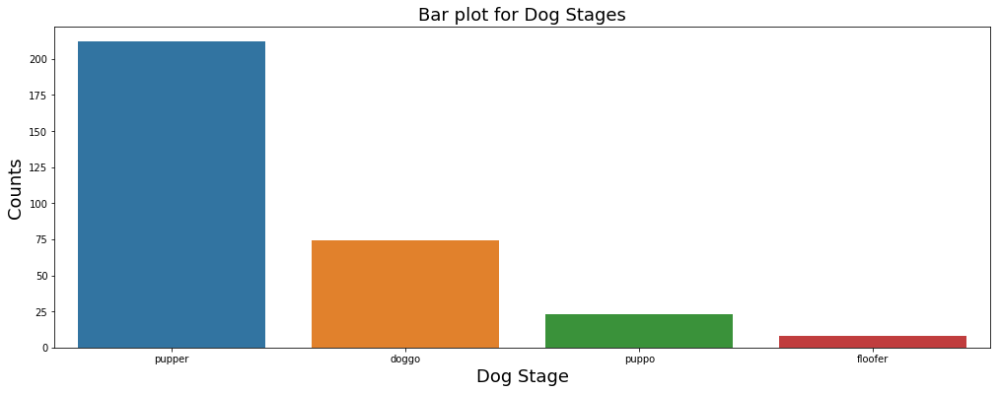

In [502]:
plt.figure(figsize = (17,6))
sns.countplot(archive['dog_stage'],order = archive['dog_stage'].value_counts().index);
plt.xlabel('Dog Stage', fontsize = 18);
plt.ylabel('Counts', fontsize = 18);
plt.title("Bar plot for Dog Stages", fontsize = 18);


- ### It seems WeRateDogs have tweeted for pupper more often than other dog stages.I wonder which dog stage gets highest retweet counts and favorite counts.

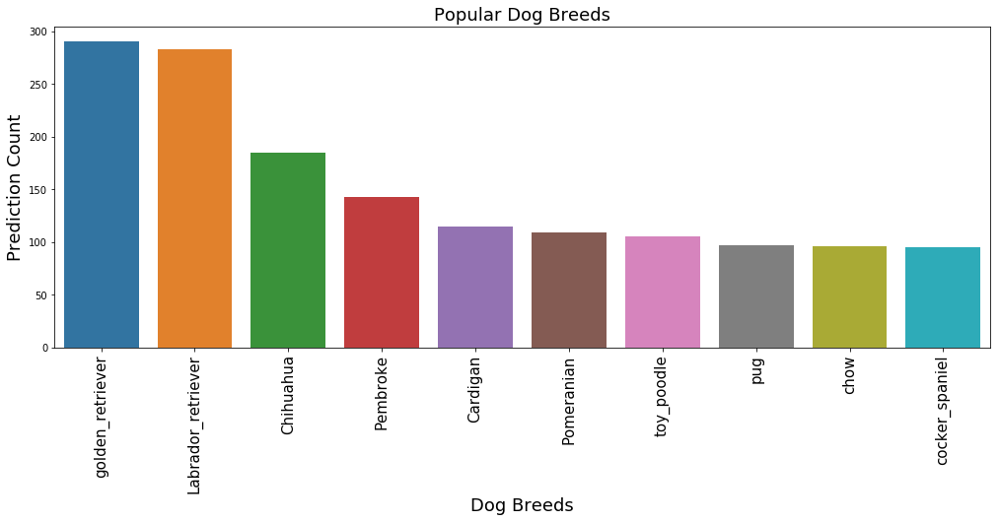

In [503]:
plt.figure(figsize = (17,6))
ax = sns.barplot(x = image_pred['prediction'].value_counts()[0:10].index,
            y =image_pred['prediction'].value_counts()[0:10],
            data = image_pred);
ax.set_xticklabels(ax.get_xticklabels(),rotation = 90, fontsize = 15);
plt.xlabel("Dog Breeds",fontsize = 18);
plt.ylabel("Prediction Count",fontsize = 18);
plt.title("Popular Dog Breeds",fontsize = 18);

In [504]:
archive.groupby('dog_stage').agg(['count','mean','median','max','min'])['retweet_count']

,count,mean,median,max,min
dog_stage,,,,,
doggo,74,6641.554054,2983.0,76970.0,693.0
floofer,8,4605.375000,3240.5,17801.0,481.0
pupper,212,2372.047170,1210.5,36210.0,99.0
puppo,23,6963.739130,3108.0,48864.0,691.0


> ### Mean retweet count of puppo is highest than other dog stages however pupper has highest counts 212 in our dataframe.Whereas if we check median retweet count floofer has highest among all.

### Mean changes with outliers but median is robust when it comes to work with outliers hence I am choosing median as estimator to plot pointplot.

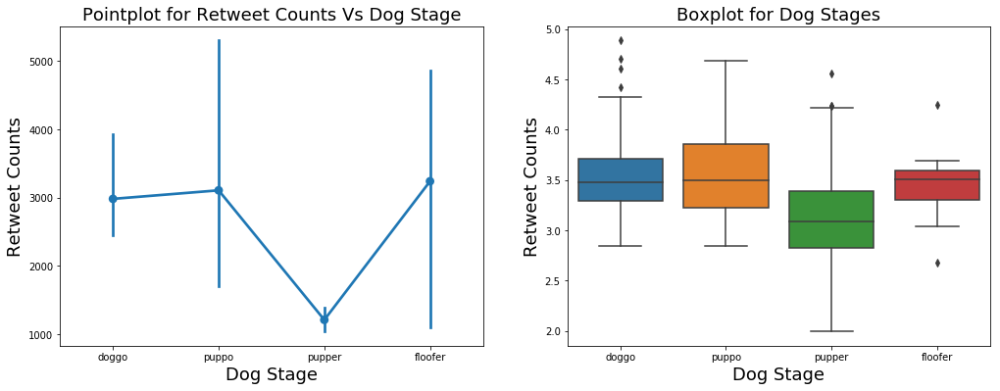

In [505]:
from numpy import median

fig,(ax1,ax2) = plt.subplots(1,2,figsize = (17,6))

sns.pointplot(x = 'dog_stage', y = 'retweet_count', data = archive,estimator = median,ax = ax1);
sns.boxplot(x = 'dog_stage', y = np.log10(archive['retweet_count']),data = archive,ax = ax2);

ax1.set_xlabel('Dog Stage',fontsize = 18);
ax1.set_ylabel('Retweet Counts',fontsize = 18);
ax2.set_xlabel('Dog Stage',fontsize = 18);
ax2.set_ylabel('Retweet Counts',fontsize = 18);
ax1.set_title('Pointplot for Retweet Counts Vs Dog Stage',fontsize = 18);
ax2.set_title('Boxplot for Dog Stages',fontsize = 18);

> ### This is interesting even after having lowest counts, floofer gets highest median retweet count and clearly pupper has lowest median count.I wonder if favorite count plot also throws puzzle.

In [506]:
archive.groupby('dog_stage').agg(['count','mean','median','max','min'])['favorite_count']

,count,mean,median,max,min
dog_stage,,,,,
doggo,74,18508.527027,11681.0,127718.0,2511.0
floofer,8,13364.250000,11563.0,32521.0,2206.0
pupper,212,7337.783019,3296.0,123890.0,670.0
puppo,23,23222.000000,15045.0,142777.0,3185.0


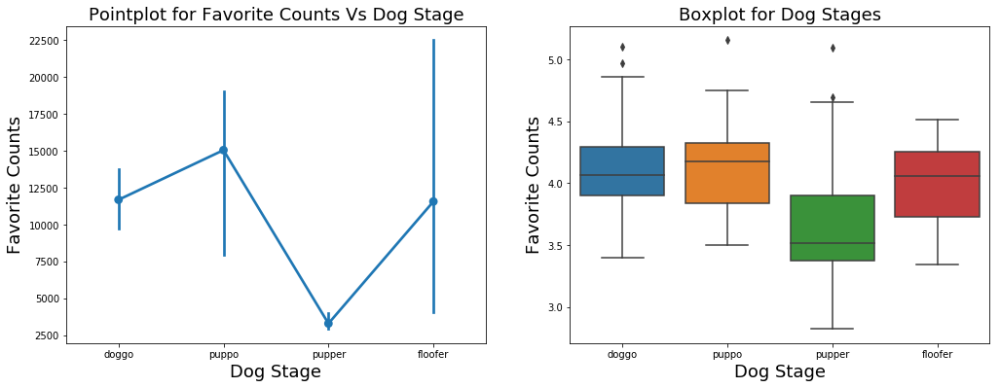

In [507]:
fig,(ax1,ax2) = plt.subplots(1,2,figsize = (17,6))

sns.pointplot(x = 'dog_stage', y = 'favorite_count', data = archive,estimator = median,ax = ax1);
sns.boxplot(x = 'dog_stage', y = np.log10(archive['favorite_count']),data = archive,ax = ax2);

ax1.set_xlabel('Dog Stage',fontsize = 18);
ax1.set_ylabel('Favorite Counts',fontsize = 18);
ax2.set_xlabel('Dog Stage',fontsize = 18);
ax2.set_ylabel('Favorite Counts',fontsize = 18);
ax1.set_title('Pointplot for Favorite Counts Vs Dog Stage',fontsize = 18);
ax2.set_title('Boxplot for Dog Stages',fontsize = 18);



> ### Puppo is favorite among twitter users as it has got highest median favorite count.I would also like to see if retweet count and favorite has any relation between them.

In [508]:
archive['favorite_count'].describe()

count    2004.000000  
mean     8852.559880  
std      12541.674298 
min      80.000000    
25%      1948.250000  
50%      4050.000000  
75%      11108.000000 
max      142777.000000
Name: favorite_count, dtype: float64

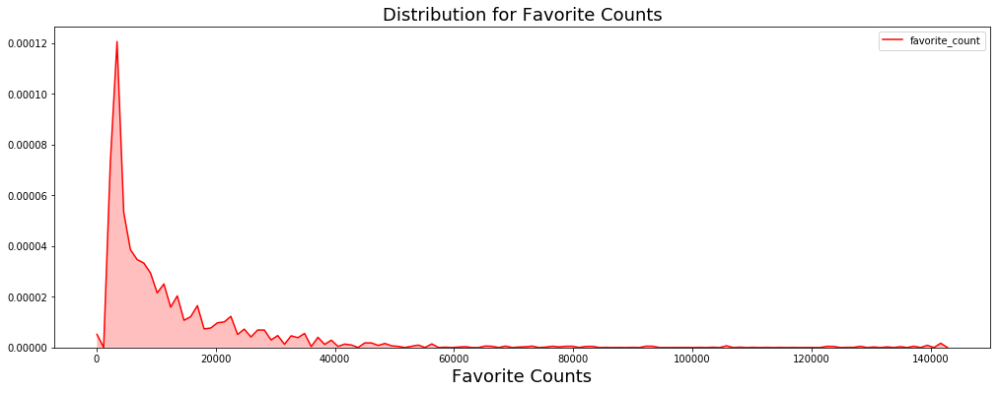

In [509]:
plt.figure(figsize = (17,6));
sns.kdeplot(archive.query("favorite_count != 'NaN'")['favorite_count'],shade = True, color = 'r',bw = 0.5);
plt.xlabel("Favorite Counts",fontsize = 18);
plt.title("Distribution for Favorite Counts",fontsize = 18);

> ### Distribution is skewed to right.Let's zoom in to see more detailed distribution.

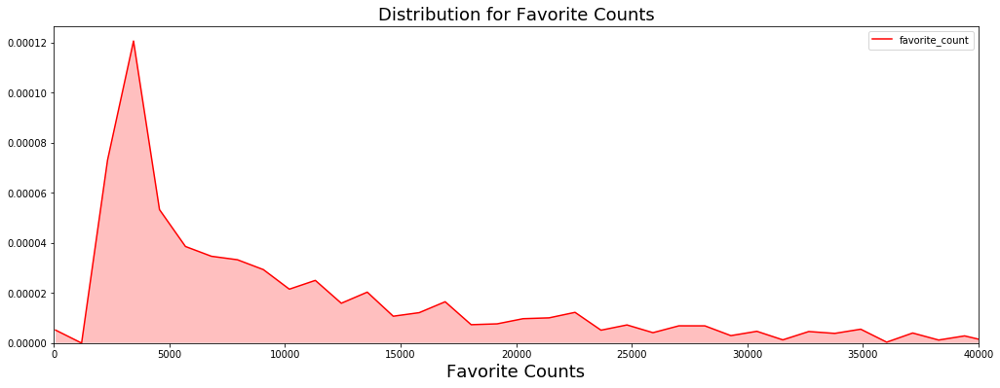

In [510]:
plt.figure(figsize = (17,6));
sns.kdeplot(archive.query("favorite_count != 'NaN'")['favorite_count'],shade = True, color = 'r',bw = 0.5);
plt.xlabel("Favorite Counts",fontsize = 18);
plt.title("Distribution for Favorite Counts",fontsize = 18);
plt.xlim(0,40000);

> ### Majority of favorite counts lies between 1000 to 10000 and then counts decreases tremendously.

In [511]:
archive['retweet_count'].describe()

count    2004.000000 
mean     2715.608283 
std      4678.449963 
min      13.000000   
25%      608.000000  
50%      1320.000000 
75%      3113.500000 
max      76970.000000
Name: retweet_count, dtype: float64

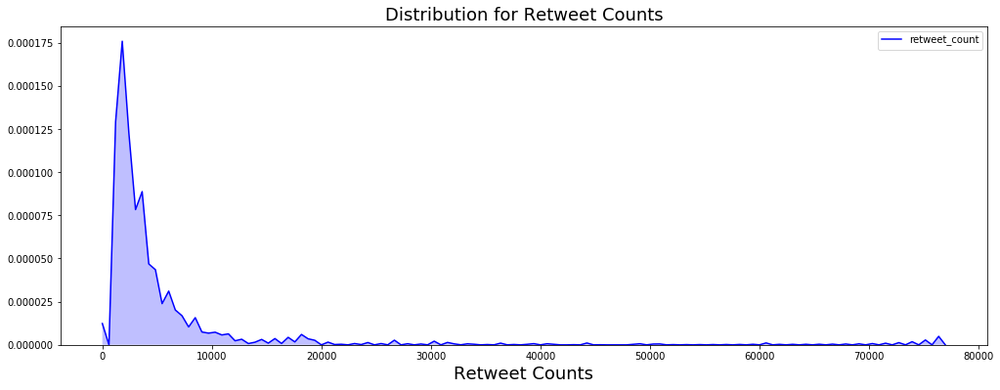

In [512]:
plt.figure(figsize = (17,6));
sns.kdeplot(archive.query("retweet_count != 'NaN'")['retweet_count'],shade = True,color = 'b',bw = 0.5);
plt.xlabel("Retweet Counts",fontsize = 18);
plt.title("Distribution for Retweet Counts",fontsize = 18);

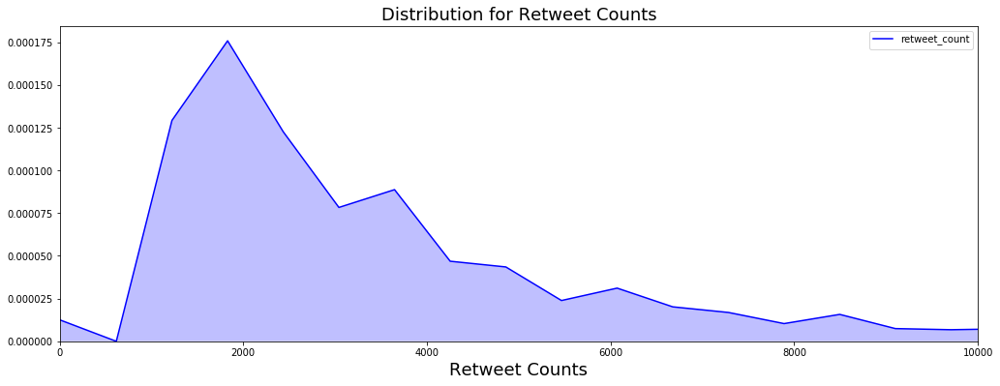

In [513]:
plt.figure(figsize = (17,6));
sns.kdeplot(archive.query("retweet_count != 'NaN'")['retweet_count'],shade = True,color = 'b',bw = 0.5);
plt.xlabel("Retweet Counts",fontsize = 18);
plt.title("Distribution for Retweet Counts",fontsize = 18);
plt.xlim(0,10000);

In [514]:
archive['timestamp'] = pd.to_datetime(archive['timestamp'])

In [515]:
archive['date'] = pd.DatetimeIndex(archive.timestamp).normalize()

In [516]:
archive.dtypes

tweet_id                      int64         
in_reply_to_status_id         float64       
in_reply_to_user_id           float64       
timestamp                     datetime64[ns]
source                        object        
text                          object        
retweeted_status_id           float64       
retweeted_status_user_id      float64       
retweeted_status_timestamp    float64       
expanded_urls                 object        
rating_numerator              int64         
rating_denominator            int64         
name                          object        
dog_stage                     object        
tweet_url                     object        
favorite_count                float64       
retweet_count                 float64       
date                          datetime64[ns]
dtype: object

In [517]:
archive['retweet_count'].describe()

count    2004.000000 
mean     2715.608283 
std      4678.449963 
min      13.000000   
25%      608.000000  
50%      1320.000000 
75%      3113.500000 
max      76970.000000
Name: retweet_count, dtype: float64

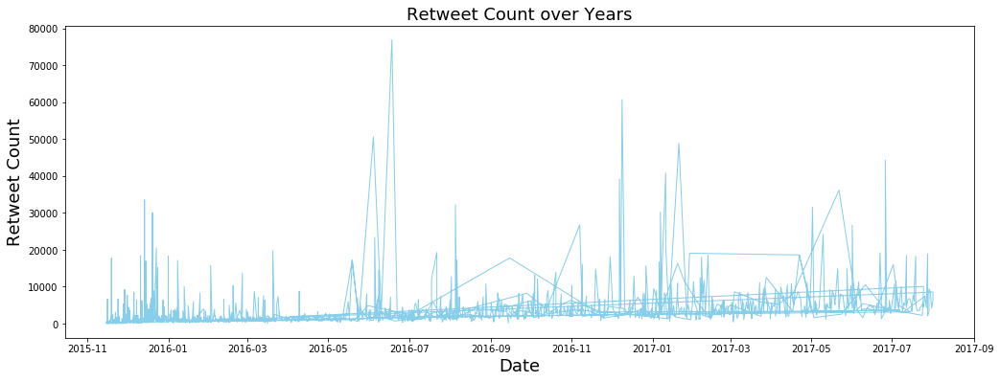

In [518]:
plt.figure(figsize = (17,6));
palette = plt.get_cmap('Set1')
plt.plot('date', 'retweet_count', data=archive,marker='',color='skyblue',linewidth=1);
plt.xlabel("Date",fontsize = 18);
plt.ylabel("Retweet Count", fontsize = 18);
plt.title('Retweet Count over Years',fontsize = 18);

> ## I can observe high peak of retweet count in 2016-06 and also since 2015 retweet counts have increased.

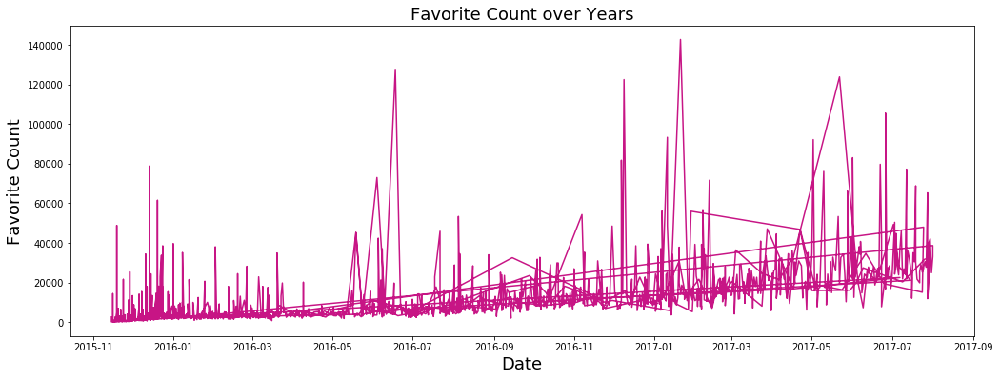

In [519]:
plt.figure(figsize = (17,6));

plt.plot('date','favorite_count',data = archive,
         marker='', color='mediumvioletred');
plt.xlabel("Date",fontsize = 18);
plt.ylabel("Favorite Count", fontsize = 18);
plt.title('Favorite Count over Years',fontsize = 18);


> ## Favorite Counts have increased over the years 

In [520]:
archive['year'] = archive['date'].dt.year

In [521]:
archive.groupby('year').count()[['favorite_count','retweet_count']]

,favorite_count,retweet_count
year,,
2015,663,663
2016,981,981
2017,360,360


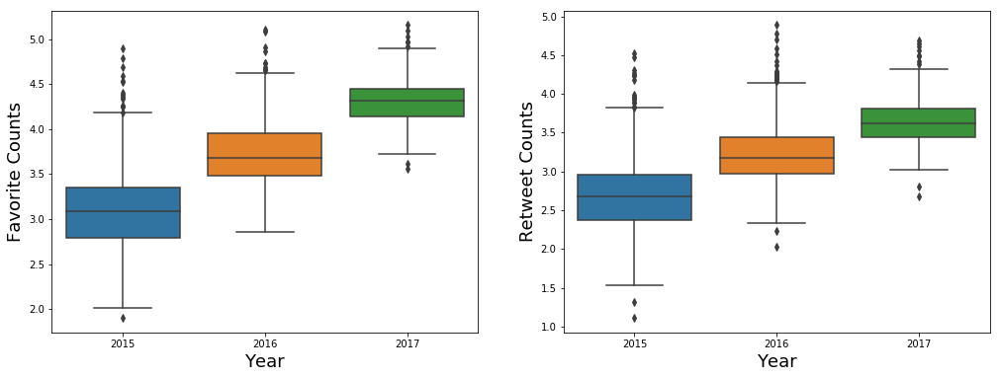

In [522]:
fig,(ax1,ax2) = plt.subplots(1,2,figsize = (17,6))
sns.boxplot(x = archive['year'],y = np.log10(archive['favorite_count']),ax = ax1);
sns.boxplot(x = archive['year'], y = np.log10(archive['retweet_count']),ax = ax2);
ax1.set_xlabel('Year',fontsize = 18);
ax1.set_ylabel('Favorite Counts',fontsize = 18);
ax2.set_xlabel('Year',fontsize = 18);
ax2.set_ylabel('Retweet Counts',fontsize = 18);

In [523]:
archive['dog_stage_counts'] = archive['dog_stage'].copy()
archive.groupby('dog_stage').count()['dog_stage_counts']

dog_stage
doggo      74 
floofer    8  
pupper     212
puppo      23 
Name: dog_stage_counts, dtype: int64

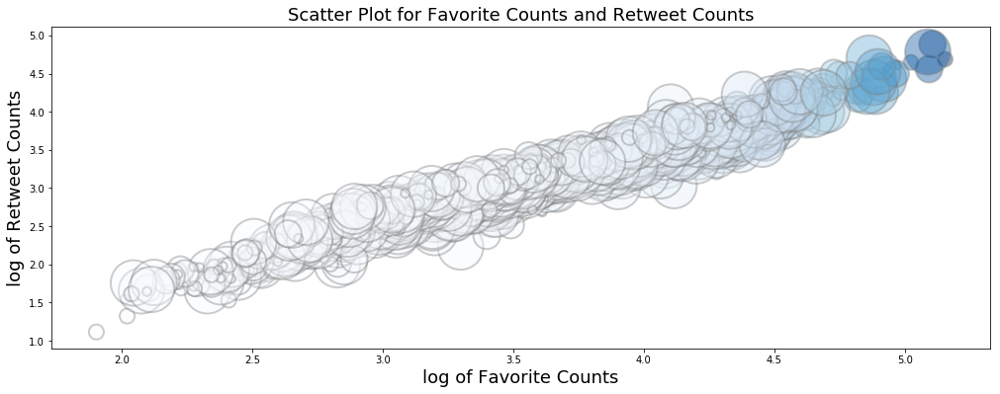

In [524]:
plt.figure(figsize = (17,6));
z = archive.groupby('dog_stage').count()['dog_stage_counts']
plt.scatter(x = np.log10(archive['favorite_count']), y = np.log10(archive['retweet_count']), s = z*10,data = archive ,
            c = 'favorite_count',cmap="Blues", alpha=0.4, edgecolors="grey", linewidth=2);
plt.xlabel('log of Favorite Counts',fontsize = 18);
plt.ylabel('log of Retweet Counts',fontsize = 18);
plt.title('Scatter Plot for Favorite Counts and Retweet Counts',fontsize = 18);

> ### Favorite Counts and Retweet Counts have strong positive relationship between them.

In [525]:
print(np.log10(archive['retweet_count'])[0:5])
print(archive['retweet_count'][0:5])

0    3.871398
1    3.475816
2    3.736954
3    3.543944
4    3.504607
Name: retweet_count, dtype: float64
0    7437.0
1    2991.0
2    5457.0
3    3499.0
4    3196.0
Name: retweet_count, dtype: float64


In [526]:
archive['rating_numerator'].describe()

count    2005.000000
mean     12.287781  
std      41.382526  
min      0.000000   
25%      10.000000  
50%      11.000000  
75%      12.000000  
max      1776.000000
Name: rating_numerator, dtype: float64

In [527]:
rating_df = archive[archive['rating_numerator'] <= 20]

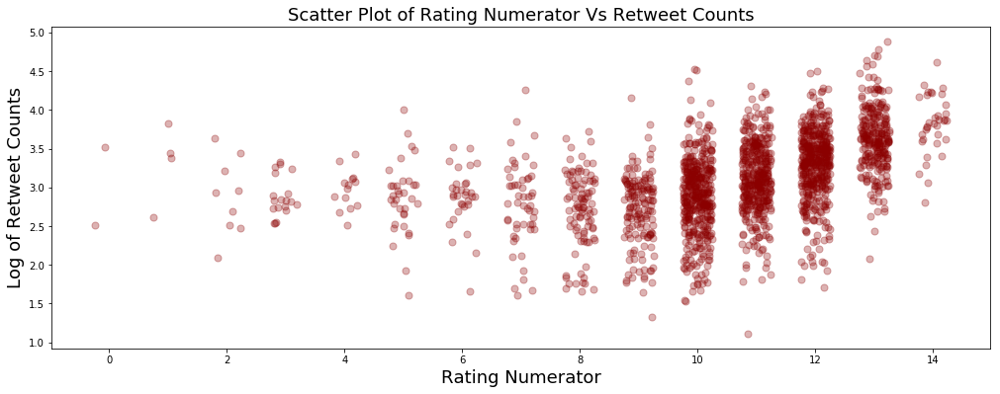

In [561]:
plt.figure(figsize = (17,6));
sns.regplot(x='rating_numerator', 
            y=np.log10(rating_df['retweet_count']), 
            data=rating_df, 
            fit_reg=False, 
            x_jitter=0.25, 
            scatter_kws={'alpha': 0.3, 's': 50,"color":"darkred"});
plt.xlabel("Rating Numerator",fontsize = 18);
plt.ylabel("Log of Retweet Counts",fontsize = 18);
plt.title("Scatter Plot of Rating Numerator Vs Retweet Counts",fontsize = 18);

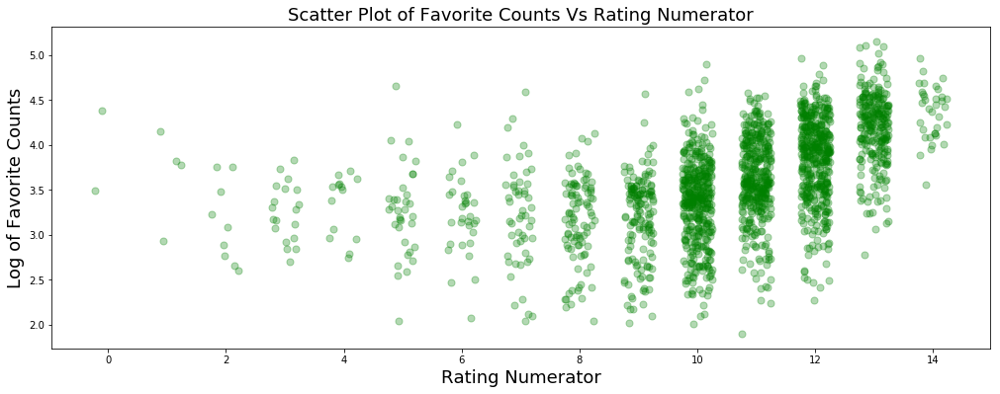

In [562]:
plt.figure(figsize = (17,6));

sns.regplot(data = rating_df,
           x = 'rating_numerator',
           y = np.log10(rating_df['favorite_count']),
           x_jitter = 0.25,
           fit_reg = False,
           scatter_kws = {'alpha' : 0.3,'s' : 50,'color':'green'});
plt.xlabel("Rating Numerator",fontsize = 18);
plt.ylabel("Log of Favorite Counts",fontsize = 18);
plt.title("Scatter Plot of Favorite Counts Vs Rating Numerator",fontsize = 18);        

In [530]:
archive.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'dog_stage', 'tweet_url',
       'favorite_count', 'retweet_count', 'date', 'year', 'dog_stage_counts'],
      dtype='object')

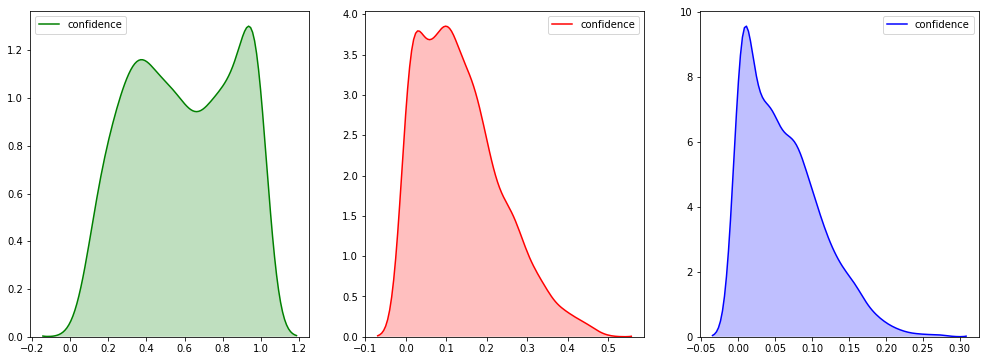

In [531]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(17,6))

sns.kdeplot(image_pred.loc[image_pred['prediction_order'] == 1,'confidence'],shade = True,color = 'g',ax = ax1);
sns.kdeplot(image_pred.loc[image_pred['prediction_order'] == 2,'confidence'],shade = True,color = 'r',ax = ax2);
sns.kdeplot(image_pred.loc[image_pred['prediction_order'] == 3,'confidence'],shade = True,color = 'b',ax =ax3);

## Top 5 favorite counts of Labrador Retriever

In [532]:
labrador_retriever_df = archive.merge(image_pred.loc[image_pred['prediction'] == 'Labrador_retriever',
                                                     ['tweet_id','jpg_url','prediction']],how = 'right',on = 'tweet_id')

In [533]:
labrador_retriever_df.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'dog_stage', 'tweet_url',
       'favorite_count', 'retweet_count', 'date', 'year', 'dog_stage_counts',
       'jpg_url', 'prediction'],
      dtype='object')

In [534]:
labrador_retriever_df.sort_values(by = 'favorite_count',ascending = False,inplace = True)

In [535]:
labrador_retriever_df.loc[:,['favorite_count','jpg_url','rating_numerator','prediction']][0:5]

,favorite_count,jpg_url,rating_numerator,prediction
27,142777.0,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,13.0,Labrador_retriever
18,127718.0,https://pbs.twimg.com/ext_tw_video_thumb/744234667679821824/pu/img/1GaWmtJtdqzZV7jy.jpg,13.0,Labrador_retriever
69,83063.0,https://pbs.twimg.com/media/DBQwlFCXkAACSkI.jpg,13.0,Labrador_retriever
65,79715.0,https://pbs.twimg.com/media/DC5YqoQW0AArOLH.jpg,13.0,Labrador_retriever
95,71676.0,https://pbs.twimg.com/media/C4bTH6nWMAAX_bJ.jpg,13.0,Labrador_retriever


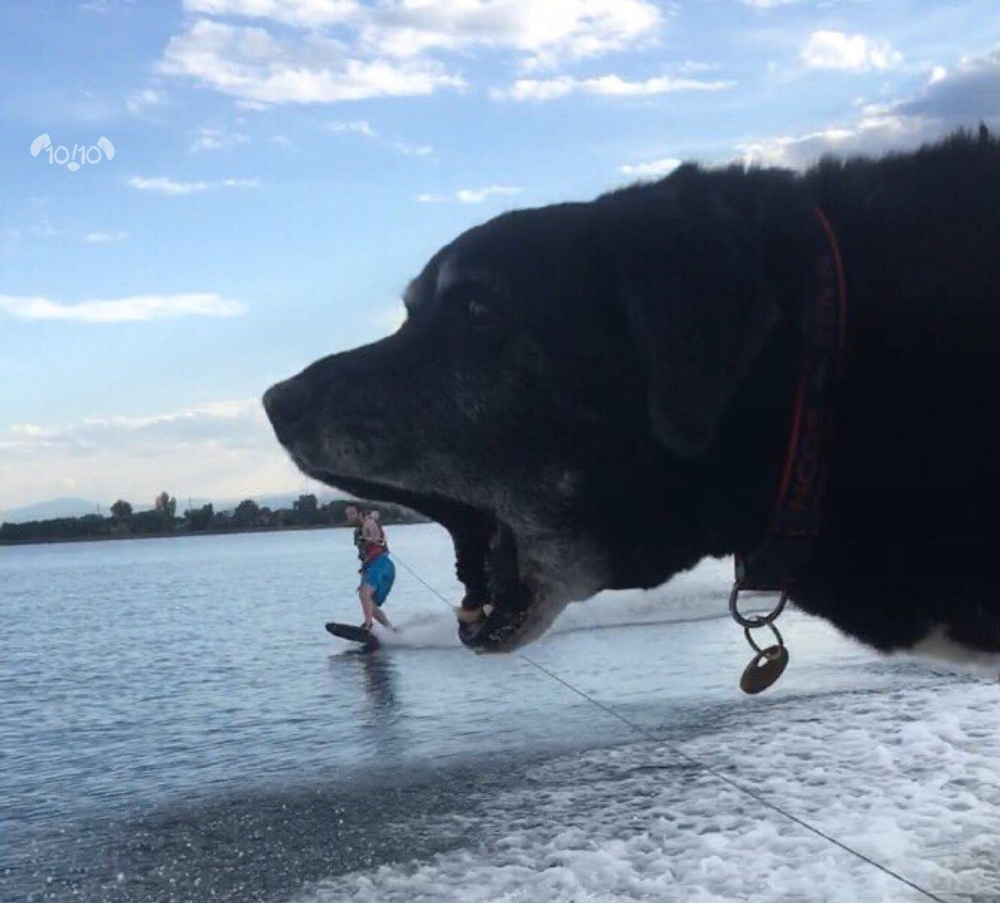

In [536]:
url = labrador_retriever_df['jpg_url'][0]
response = requests.get(url)
Image.open(BytesIO(response.content))

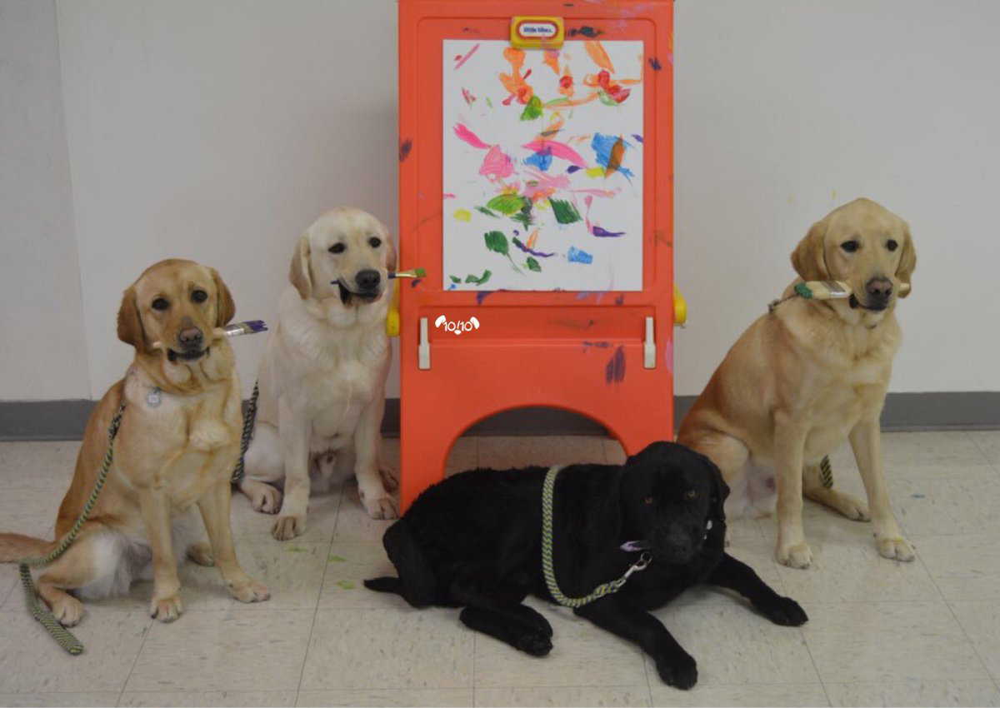

In [537]:
url = labrador_retriever_df['jpg_url'][1]
response = requests.get(url)
Image.open(BytesIO(response.content))

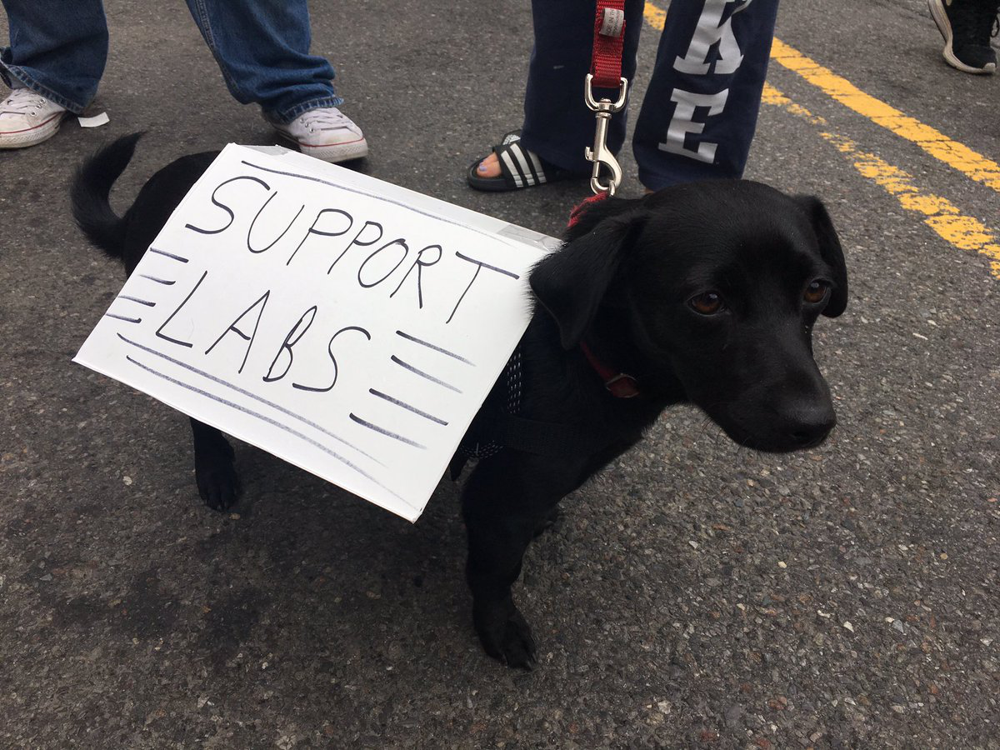

In [538]:
url = labrador_retriever_df['jpg_url'][2]
response = requests.get(url)
Image.open(BytesIO(response.content))

## Highest favorite counts of Golden Retriever

In [539]:
golden_retriever_df = archive.merge(image_pred.loc[image_pred['prediction'] == 'golden_retriever',
                                                     ['tweet_id','jpg_url','prediction']],how = 'right',on = 'tweet_id')

In [540]:
golden_retriever_df.sort_values(by = 'favorite_count',
                                ascending = False,inplace = True)

In [564]:
golden_retriever_df.loc[:,['tweet_id','favorite_count','jpg_url','rating_numerator','prediction']][0:5]

,tweet_id,favorite_count,jpg_url,rating_numerator,prediction
62,870374049280663552,83063.0,https://pbs.twimg.com/media/DBQwlFCXkAACSkI.jpg,13.0,golden_retriever
91,817827839487737858,56167.0,https://pbs.twimg.com/ext_tw_video_thumb/817827663108771841/pu/img/e9oi839RGWJR37jF.jpg,13.0,golden_retriever
11,795464331001561088,54299.0,https://pbs.twimg.com/ext_tw_video_thumb/795464066940764160/pu/img/jPkMMQXdydb7CqFX.jpg,13.0,golden_retriever
58,881666595344535552,50403.0,https://pbs.twimg.com/media/DDxPFwbWAAEbVVR.jpg,13.0,golden_retriever
1,846514051647705089,47090.0,https://pbs.twimg.com/media/C79sB4xXwAEvwKY.jpg,13.0,golden_retriever


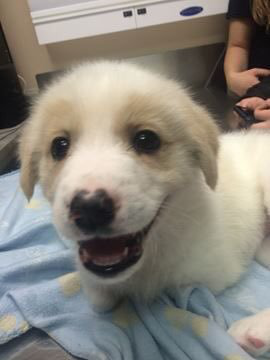

In [542]:
url = golden_retriever_df['jpg_url'][5]
response = requests.get(url)
Image.open(BytesIO(response.content))

8    This is Barney. He's an elder doggo. Hitches a ride when he gets tired. Waves goodbye before he leaves. 13/10 please come back soon 
Name: text, dtype: object


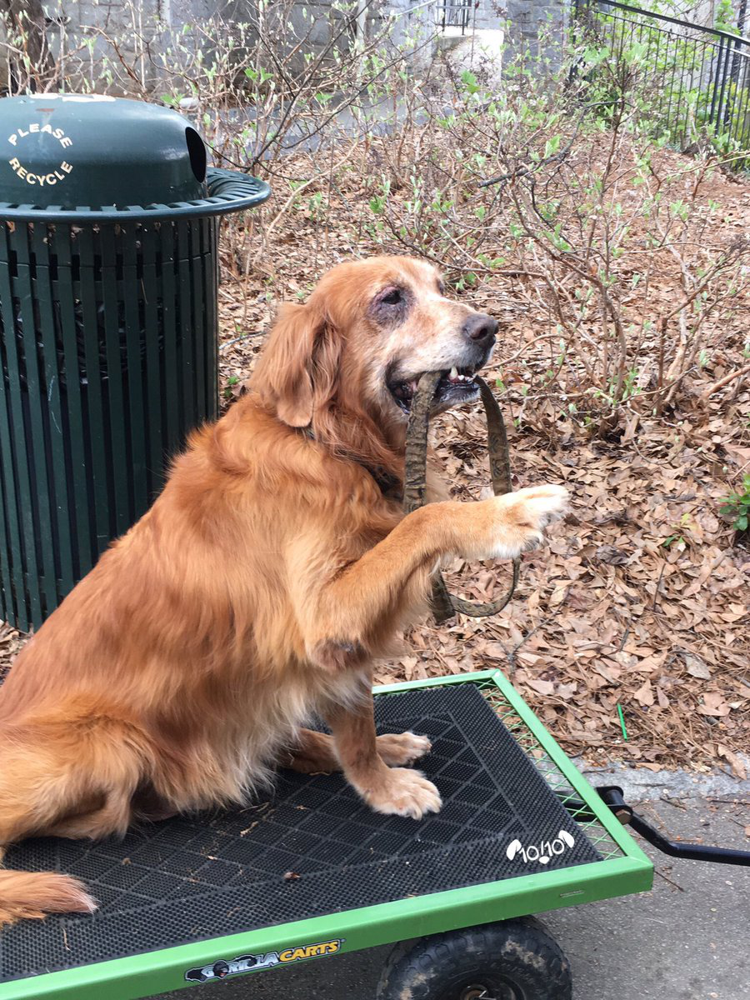

In [569]:
url = golden_retriever_df['jpg_url'][1]
print(archive.query("tweet_id == '846514051647705089'")['text'])
response = requests.get(url)
Image.open(BytesIO(response.content))

358    This is Gary. He couldn't miss this puppertunity for a selfie. Flawless focusing skills. 13/10 would boop intensely 
Name: text, dtype: object


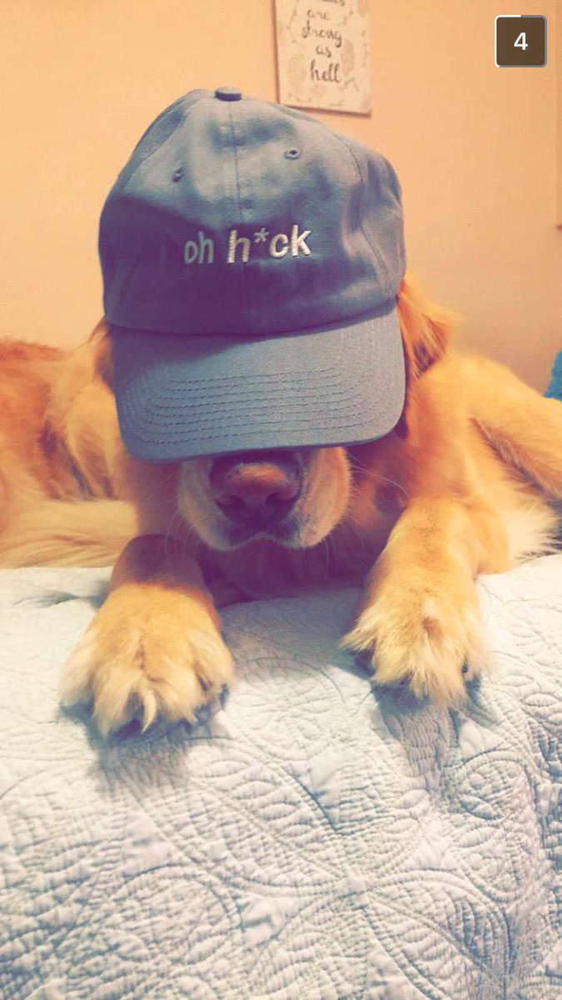

In [586]:
url = golden_retriever_df['jpg_url'][3]
print(archive.query("tweet_id == '881666595344535552'")['text'])
response = requests.get(url)
Image.open(BytesIO(response.content))

## Dogs with Highest Rating Numerator

In [570]:
archive.sort_values(by = 'rating_numerator',ascending = False).loc[:,['tweet_id','text',
                                                                      'retweet_count','favorite_count','rating_numerator']][0:5]

,tweet_id,text,retweet_count,favorite_count,rating_numerator
916,749981277374128128,This is Atticus. He's quite simply America af. 1776/10,2697.0,5493.0,1776
1729,670842764863651840,After so many requests... here you go.\r\n\r\nGood dogg. 420/10,9231.0,25396.0,420
1012,731156023742988288,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once,1386.0,4078.0,204
870,758467244762497024,Why does this never happen at my front door... 165/150,2459.0,5169.0,165
1489,677716515794329600,IT'S PUPPERGEDDON. Total of 144/120 ...I think,1057.0,3227.0,144


In [546]:
image_pred.query("tweet_id == 749981277374128128 ")

,tweet_id,jpg_url,img_num,prediction_order,prediction,confidence,ispred
3810,749981277374128128,https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg,1,1,bow_tie,0.533941,False
3811,749981277374128128,https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg,1,2,sunglasses,0.080822,False
3812,749981277374128128,https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg,1,3,sunglass,0.050776,False


In [547]:
image_pred.query("tweet_id == 749981277374128128 ")['jpg_url']

3810    https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg
3811    https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg
3812    https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg
Name: jpg_url, dtype: object

916    This is Atticus. He's quite simply America af. 1776/10 
Name: text, dtype: object


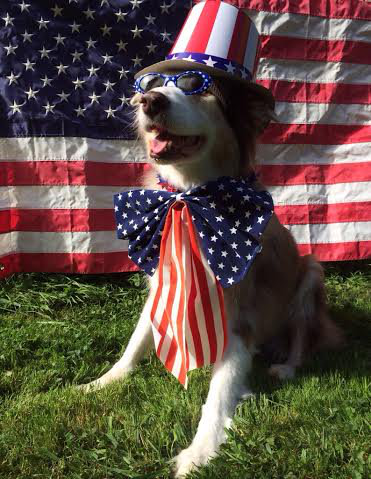

In [573]:
url = 'https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg'
print(archive.query("tweet_id == 749981277374128128")['text'])
response = requests.get(url)
Image.open(BytesIO(response.content))

In [549]:
image_pred.query("tweet_id == 731156023742988288")

,tweet_id,jpg_url,img_num,prediction_order,prediction,confidence,ispred
3444,731156023742988288,https://pbs.twimg.com/media/CiWWhVNUYAAab_r.jpg,1,1,lakeside,0.501767,False
3445,731156023742988288,https://pbs.twimg.com/media/CiWWhVNUYAAab_r.jpg,1,2,breakwater,0.051351,False
3446,731156023742988288,https://pbs.twimg.com/media/CiWWhVNUYAAab_r.jpg,1,3,king_penguin,0.049444,False


In [550]:
image_pred.query("tweet_id == 731156023742988288")['jpg_url']

3444    https://pbs.twimg.com/media/CiWWhVNUYAAab_r.jpg
3445    https://pbs.twimg.com/media/CiWWhVNUYAAab_r.jpg
3446    https://pbs.twimg.com/media/CiWWhVNUYAAab_r.jpg
Name: jpg_url, dtype: object

1012    Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once 
Name: text, dtype: object


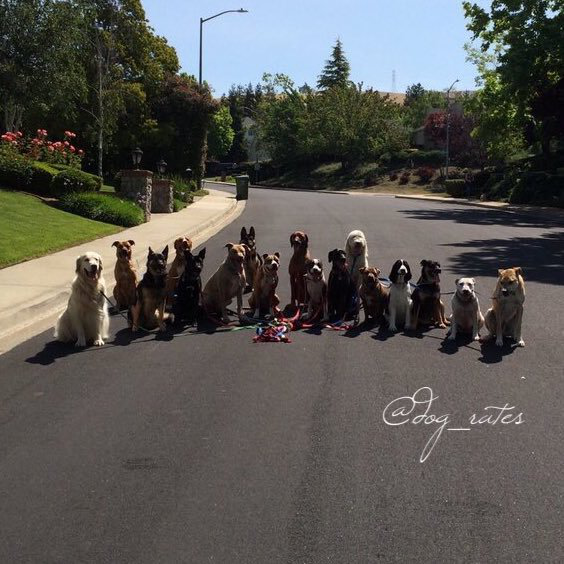

In [574]:
url = 'https://pbs.twimg.com/media/CiWWhVNUYAAab_r.jpg'
print(archive.query("tweet_id == 731156023742988288")['text'])
response = requests.get(url)
Image.open(BytesIO(response.content))

In [552]:
image_pred.query("tweet_id == 758467244762497024")

,tweet_id,jpg_url,img_num,prediction_order,prediction,confidence,ispred
4014,758467244762497024,https://pbs.twimg.com/ext_tw_video_thumb/758467147756691456/pu/img/YTNzjRFDSPNXukmM.jpg,1,1,Labrador_retriever,0.436377,True
4015,758467244762497024,https://pbs.twimg.com/ext_tw_video_thumb/758467147756691456/pu/img/YTNzjRFDSPNXukmM.jpg,1,2,Chihuahua,0.113956,True
4016,758467244762497024,https://pbs.twimg.com/ext_tw_video_thumb/758467147756691456/pu/img/YTNzjRFDSPNXukmM.jpg,1,3,American_Staffordshire_terrier,0.099689,True


In [553]:
image_pred.query("tweet_id == 758467244762497024")['jpg_url']

4014    https://pbs.twimg.com/ext_tw_video_thumb/758467147756691456/pu/img/YTNzjRFDSPNXukmM.jpg
4015    https://pbs.twimg.com/ext_tw_video_thumb/758467147756691456/pu/img/YTNzjRFDSPNXukmM.jpg
4016    https://pbs.twimg.com/ext_tw_video_thumb/758467147756691456/pu/img/YTNzjRFDSPNXukmM.jpg
Name: jpg_url, dtype: object

870    Why does this never happen at my front door... 165/150 
Name: text, dtype: object


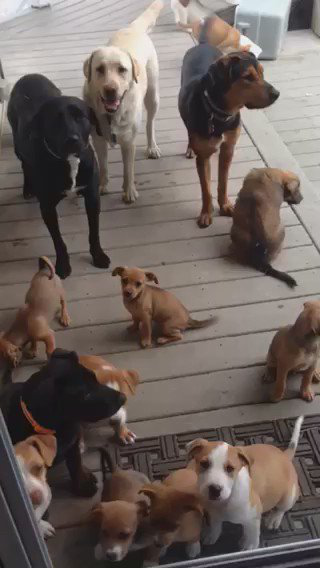

In [575]:
url = 'https://pbs.twimg.com/ext_tw_video_thumb/758467147756691456/pu/img/YTNzjRFDSPNXukmM.jpg'
print(archive.query("tweet_id == 758467244762497024")['text'])
response = requests.get(url)
Image.open(BytesIO(response.content))

## Lowest Numerator 

In [577]:
archive.sort_values(by = 'rating_numerator').loc[:,['tweet_id','text','rating_numerator']][0:5]

,tweet_id,text,rating_numerator
941,746906459439529985,"PUPDATE: can't see any. Even if I could, I couldn't reach them to pet. 0/10 much disappointment",0
520,835152434251116546,When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10,0
1987,666104133288665088,Not familiar with this breed. No tail (weird). Only 2 legs. Doesn't bark. Surprisingly quick. Shits eggs. 1/10,1
1746,670783437142401025,Flamboyant pup here. Probably poisonous. Won't eat kibble. Doesn't bark. Slow af. Petting doesn't look fun. 1/10,1
1560,675153376133427200,What kind of person sends in a picture without a dog in it? 1/10 just because that's a nice table,1


In [555]:
archive['rating_numerator'].idxmin()

520

In [556]:
archive.loc[520,['tweet_id','rating_numerator','tweet_url','text']]

tweet_id            835152434251116546                                                                        
rating_numerator    0                                                                                         
tweet_url           https://t.co/YbEJPkg4Ag                                                                   
text                When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 
Name: 520, dtype: object

In [557]:
image_pred.query("tweet_id == 835152434251116546")

,tweet_id,jpg_url,img_num,prediction_order,prediction,confidence,ispred
5472,835152434251116546,https://pbs.twimg.com/media/C5cOtWVWMAEjO5p.jpg,3,1,swing,0.967066,False
5473,835152434251116546,https://pbs.twimg.com/media/C5cOtWVWMAEjO5p.jpg,3,2,American_Staffordshire_terrier,0.012731,True
5474,835152434251116546,https://pbs.twimg.com/media/C5cOtWVWMAEjO5p.jpg,3,3,Staffordshire_bullterrier,0.007039,True


520    When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 
Name: text, dtype: object


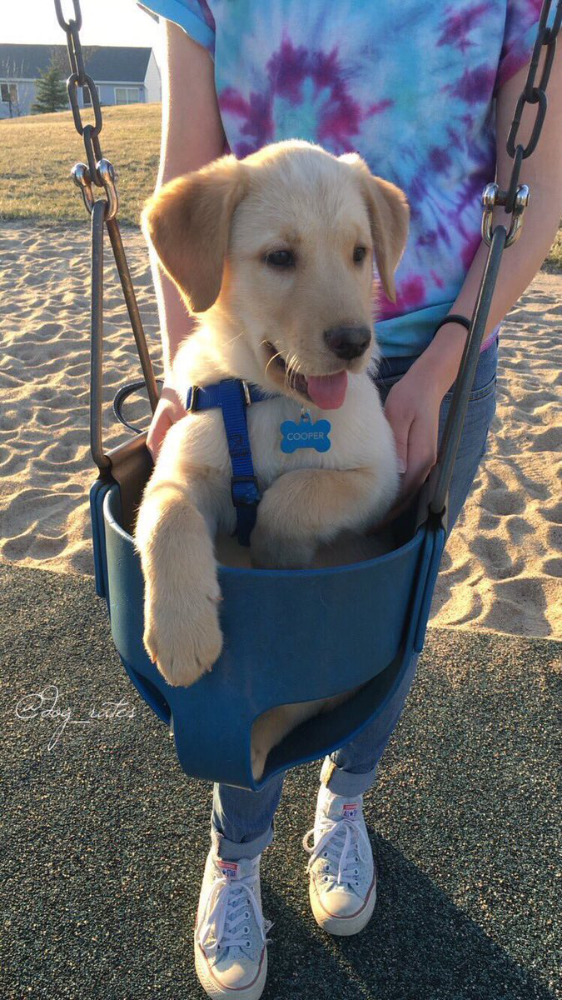

In [576]:
url = 'https://pbs.twimg.com/media/C5cOtWVWMAEjO5p.jpg'
print(archive.query("tweet_id == 835152434251116546")['text'])
response = requests.get(url)
Image.open(BytesIO(response.content))

In [579]:
image_pred.query("tweet_id == 746906459439529985")

,tweet_id,jpg_url,img_num,prediction_order,prediction,confidence,ispred
3720,746906459439529985,https://pbs.twimg.com/media/Cl2LdofXEAATl7x.jpg,1,1,traffic_light,0.470708,False
3721,746906459439529985,https://pbs.twimg.com/media/Cl2LdofXEAATl7x.jpg,1,2,fountain,0.199776,False
3722,746906459439529985,https://pbs.twimg.com/media/Cl2LdofXEAATl7x.jpg,1,3,space_shuttle,0.064807,False


941    PUPDATE: can't see any. Even if I could, I couldn't reach them to pet. 0/10 much disappointment 
Name: text, dtype: object


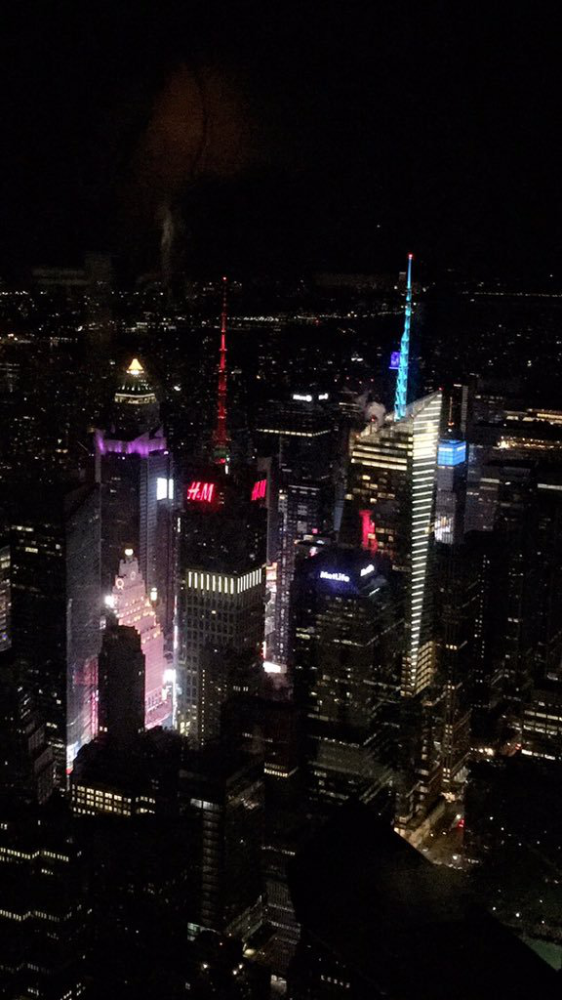

In [582]:
url = 'https://pbs.twimg.com/media/Cl2LdofXEAATl7x.jpg'
print(archive.query("tweet_id == 746906459439529985")['text'])
response = requests.get(url)
Image.open(BytesIO(response.content))

In [583]:
image_pred.query("tweet_id == 666104133288665088")

,tweet_id,jpg_url,img_num,prediction_order,prediction,confidence,ispred
51,666104133288665088,https://pbs.twimg.com/media/CT56LSZWoAAlJj2.jpg,1,1,hen,0.965932,False
52,666104133288665088,https://pbs.twimg.com/media/CT56LSZWoAAlJj2.jpg,1,2,cock,0.033919,False
53,666104133288665088,https://pbs.twimg.com/media/CT56LSZWoAAlJj2.jpg,1,3,partridge,0.000052,False


1987    Not familiar with this breed. No tail (weird). Only 2 legs. Doesn't bark. Surprisingly quick. Shits eggs. 1/10 
Name: text, dtype: object


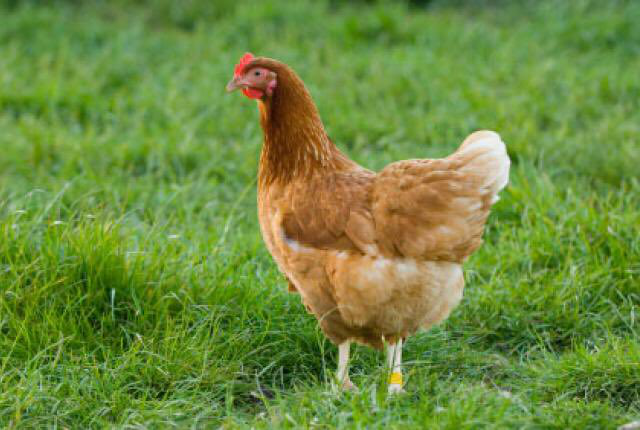

In [585]:
url = 'https://pbs.twimg.com/media/CT56LSZWoAAlJj2.jpg'
print(archive.query("tweet_id == 666104133288665088")['text'])
response = requests.get(url)
Image.open(BytesIO(response.content))

<a id='Reference'></a>
# Reference

- [melt several groups of columns into multiple target columns](https://stackoverflow.com/questions/38862832/pandas-melt-several-groups-of-columns-into-multiple-target-columns-by-name)

- [SettingWithCopyWarning](https://www.youtube.com/watch?v=4R4WsDJ-KVc&index=27&list=PL5-da3qGB5ICCsgW1MxlZ0Hq8LL5U3u9y)

- [seaborn pointplot](https://seaborn.pydata.org/generated/seaborn.pointplot.html)

- [dropping time from datetime](https://stackoverflow.com/questions/24786209/dropping-time-from-datetime-m8-in-pandas)

- [time variation grpah](https://python-graph-gallery.com/106-seaborn-style-on-matplotlib-plot/)

- [Control bandwidth of density plot](https://python-graph-gallery.com/73-control-bandwidth-of-seaborn-density-plot/)

- [Bubble Plot](https://python-graph-gallery.com/272-map-a-color-to-bubble-plot/)

- [numpy log10](https://docs.scipy.org/doc/numpy/reference/generated/numpy.log10.html)